In [1]:
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import keras
from tqdm import tqdm
from keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')

# Resource-tracking imports
import time
import tracemalloc
import psutil
import gc

# Install pynvml if not present (for GPU VRAM tracking)
try:
    import pynvml
    pynvml.nvmlInit()
    _GPU_AVAILABLE = True
except Exception:
    _GPU_AVAILABLE = False
    print("[INFO] pynvml not available or no GPU found — GPU metrics will be skipped.")


[INFO] pynvml not available or no GPU found — GPU metrics will be skipped.


In [2]:
# ════════════════════════════════════════════════════════════════════
#  RESOURCE METRIC HELPERS
#  Collects: RAM (psutil), GPU VRAM (pynvml), wall-clock time,
#            peak RAM (tracemalloc), model params, inference latency
# ════════════════════════════════════════════════════════════════════

_process = psutil.Process(os.getpid())
_metrics_log = {}  


def _ram_mb():
    """Current process RSS in MB."""
    return _process.memory_info().rss / 1024**2


def _gpu_vram_mb():
    """Used GPU VRAM in MB for device 0 (returns 0 if unavailable)."""
    if not _GPU_AVAILABLE:
        return 0.0
    try:
        handle = pynvml.nvmlDeviceGetHandleByIndex(0)
        info   = pynvml.nvmlDeviceGetMemoryInfo(handle)
        return info.used / 1024**2
    except Exception:
        return 0.0


class ResourceCallback(tf.keras.callbacks.Callback):
    """
    Keras callback that samples RAM & GPU VRAM at the END of every epoch.
    Attach it to model.fit() like any other callback.
    """
    def __init__(self, model_name):
        super().__init__()
        self.model_name = model_name
        self.epoch_ram_mb   = []
        self.epoch_vram_mb  = []

    def on_epoch_end(self, epoch, logs=None):
        self.epoch_ram_mb.append(_ram_mb())
        self.epoch_vram_mb.append(_gpu_vram_mb())


def start_training_metrics(model_name, model):
    """Call BEFORE model.fit(). Returns a dict to pass to stop_training_metrics()."""
    gc.collect()
    tf.keras.backend.clear_session()          # flush dead tensors
    tracemalloc.start()
    ctx = {
        "model_name"    : model_name,
        "params"        : model.count_params(),
        "t_start"       : time.perf_counter(),
        "ram_before_mb" : _ram_mb(),
        "vram_before_mb": _gpu_vram_mb(),
        "res_cb"        : ResourceCallback(model_name),
    }
    return ctx


def stop_training_metrics(ctx, hist, model, X_val_arr, y_val_arr):
    """
    Call AFTER model.fit() finishes.
    hist   – history object returned by model.fit()
    X_val_arr / y_val_arr – numpy arrays for inference latency test
    """
    elapsed_s         = time.perf_counter() - ctx["t_start"]
    ram_after_mb      = _ram_mb()
    vram_after_mb     = _gpu_vram_mb()
    _, peak_trace_mb  = tracemalloc.get_traced_memory()
    tracemalloc.stop()
    peak_trace_mb    /= 1024**2

    # Inference latency: predict a single batch (32 images), repeat 10x
    batch = X_val_arr[:32]
    _warmup = model.predict(batch, verbose=0)          # warm-up pass
    t0 = time.perf_counter()
    for _ in range(10):
        model.predict(batch, verbose=0)
    infer_ms_per_batch = (time.perf_counter() - t0) / 10 * 1000   # ms
    infer_ms_per_image = infer_ms_per_batch / len(batch)

    entry = {
        "model_name"          : ctx["model_name"],
        "total_params"        : ctx["params"],
        "train_time_s"        : round(elapsed_s, 1),
        "ram_before_mb"       : round(ctx["ram_before_mb"], 1),
        "ram_after_mb"        : round(ram_after_mb, 1),
        "ram_delta_mb"        : round(ram_after_mb - ctx["ram_before_mb"], 1),
        "peak_tracemalloc_mb" : round(peak_trace_mb, 1),
        "vram_before_mb"      : round(ctx["vram_before_mb"], 1),
        "vram_after_mb"       : round(vram_after_mb, 1),
        "vram_delta_mb"       : round(vram_after_mb - ctx["vram_before_mb"], 1),
        "epoch_ram_samples"   : ctx["res_cb"].epoch_ram_mb,
        "epoch_vram_samples"  : ctx["res_cb"].epoch_vram_mb,
        "peak_epoch_ram_mb"   : round(max(ctx["res_cb"].epoch_ram_mb or [ram_after_mb]), 1),
        "peak_epoch_vram_mb"  : round(max(ctx["res_cb"].epoch_vram_mb or [vram_after_mb]), 1),
        "epochs_run"          : len(hist.history.get("loss", [])),
        "infer_ms_per_batch"  : round(infer_ms_per_batch, 2),
        "infer_ms_per_image"  : round(infer_ms_per_image, 3),
        "val_accuracy"        : round(max(hist.history.get("val_accuracy", [0])), 4),
    }
    _metrics_log[ctx["model_name"]] = entry
    print(f"\n{'='*55}")
    print(f"  {ctx['model_name']} — resource summary")
    print(f"{'='*55}")
    print(f"  Params              : {entry['total_params']:,}")
    print(f"  Training time       : {entry['train_time_s']} s")
    print(f"  Epochs run          : {entry['epochs_run']}")
    print(f"  RAM delta           : {entry['ram_delta_mb']} MB  "
          f"(before {entry['ram_before_mb']} → after {entry['ram_after_mb']})")
    print(f"  Peak RAM (tracer)   : {entry['peak_tracemalloc_mb']} MB")
    print(f"  Peak epoch RAM      : {entry['peak_epoch_ram_mb']} MB")
    if _GPU_AVAILABLE:
        print(f"  VRAM delta          : {entry['vram_delta_mb']} MB  "
              f"(before {entry['vram_before_mb']} → after {entry['vram_after_mb']})")
        print(f"  Peak epoch VRAM     : {entry['peak_epoch_vram_mb']} MB")
    print(f"  Infer latency/img   : {entry['infer_ms_per_image']} ms")
    print(f"  Val accuracy (best) : {entry['val_accuracy']}")
    print(f"{'='*55}\n")
    return entry


print("✅ Resource-metric helpers loaded.")


✅ Resource-metric helpers loaded.


In [3]:
image_data = "kaggle/Faulty_solar_panel"
pd.DataFrame(os.listdir(image_data),columns=['Files_Name'])

,Files_Name
0,Bird-drop
1,Clean
2,Dusty
3,Electrical-damage
4,Physical-Damage
5,Snow-Covered


In [4]:
OUTPUT_DIR = "output/"
if not os.path.exists(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)
    print("Folder created successfully!")

In [5]:
import random
SEED = 100
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

In [6]:
pip install split-folders


[notice] A new release of pip is available: 23.0.1 -> 26.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [7]:
import splitfolders  # pip install split-folders

train_data_dir = image_data
batch_size     = 32
target_size    = (224, 224)
SPLIT_SEED     = 100
SPLIT_OUTPUT_DIR = "dataset_split"

# One-time: split the dataset on disk into 70/15/15, stratified by class folder
splitfolders.ratio(
    image_data, # source: one folder per class
    output=SPLIT_OUTPUT_DIR, # creates dataset_split/train, /val, /test
    seed=SPLIT_SEED,
    ratio=(0.70, 0.15, 0.15),
)

train = tf.keras.utils.image_dataset_from_directory(
    f"{SPLIT_OUTPUT_DIR}/train",
    image_size=target_size, batch_size=batch_size, seed=SPLIT_SEED,
)
validation = tf.keras.utils.image_dataset_from_directory(
    f"{SPLIT_OUTPUT_DIR}/val",
    image_size=target_size, batch_size=batch_size, seed=SPLIT_SEED,
)
test = tf.keras.utils.image_dataset_from_directory(
    f"{SPLIT_OUTPUT_DIR}/test",
    image_size=target_size, batch_size=batch_size, seed=SPLIT_SEED,
    shuffle=False,   # keep order fixed so predictions line up with labels
)

Copying files: 875 files [00:05, 170.22 files/s]
Found 605 files belonging to 6 classes.
Found 126 files belonging to 6 classes.
Found 138 files belonging to 6 classes.


In [8]:
from sklearn.utils.class_weight import compute_class_weight
import pathlib

# Shared augmentation recipe used by MobileNetV2, EfficientNet-Lite0 and VGG16.
# (ShuffleNetV2 keeps its own built-in augmentation defined in build_shufflenet.)
data_augmentation = keras.Sequential([
    keras.layers.RandomFlip("horizontal_and_vertical"),
    keras.layers.RandomRotation(20 / 360),        # +/- 20 degrees
    keras.layers.RandomZoom((-0.2, 0.2)),         # 0.8x - 1.2x
    keras.layers.RandomBrightness(0.2),
    keras.layers.GaussianNoise(0.05),
], name="augmentation")

# Class weights computed from the actual training-split folder counts,
# so minority classes (e.g. Electrical-damage) cost more when misclassified.
# Class order derived independently (sorted folder names) rather than from
# `class_names`, since that is defined by the next cell.
train_dir = pathlib.Path(f"{SPLIT_OUTPUT_DIR}/train")
class_list = sorted(d.name for d in train_dir.iterdir() if d.is_dir())
labels_all = []
for idx, cls in enumerate(class_list):
    labels_all += [idx] * len(list((train_dir / cls).glob('*.*')))

class_weights = dict(enumerate(
    compute_class_weight('balanced', classes=np.unique(labels_all), y=labels_all)
))
print("Class weights:", class_weights)

Class weights: {0: np.float64(0.7574626865671642), 1: np.float64(0.7518518518518519), 2: np.float64(0.7631578947368421), 3: np.float64(1.4097222222222223), 4: np.float64(2.0714285714285716), 5: np.float64(1.180232558139535)}


In [9]:
class_names = train.class_names
class_names

['Bird-drop', 'Clean', 'Dusty', 'Electrical-damage', 'Physical-Damage', 'Snow-Covered']

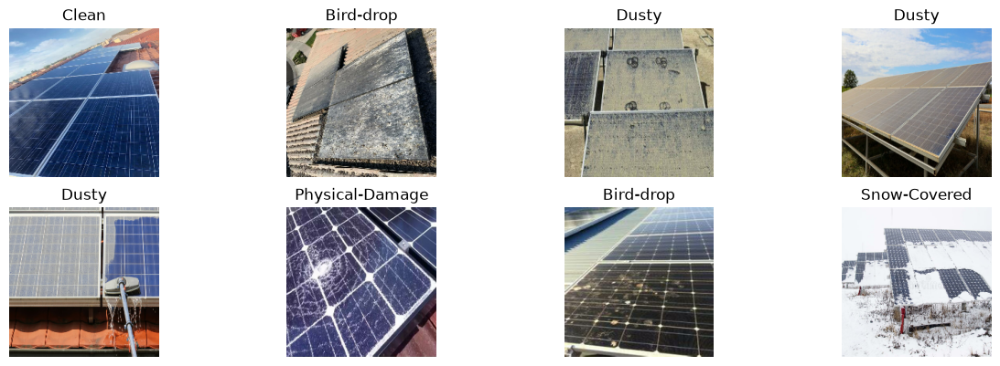

In [10]:
plt.figure(figsize=(15, 20))
for images, labels in train.take(1):
    for i in range(8):
        ax = plt.subplot(8, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

## Exploratory Data Analysis (EDA)
The following cells perform a complete visual EDA of the solar PV fault dataset
before any model training. 


Class Distribution:
  Clean                 : 194 images
  Bird-drop             : 192 images
  Dusty                 : 191 images
  Snow-Covered          : 124 images
  Electrical-damage     : 104 images
  Physical-Damage       : 70 images
  TOTAL                 : 875 images
  Imbalance ratio (max/min): 2.77x
✅ Saved: eda_class_distribution.png


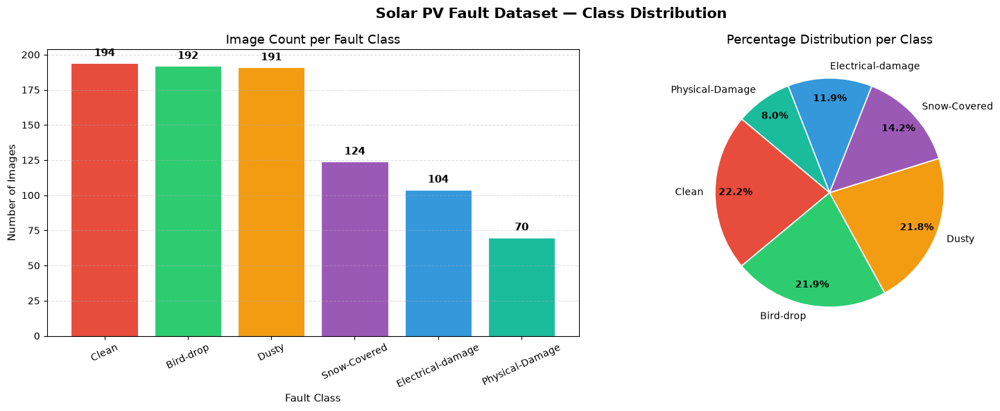

In [11]:
# ════════════════════════════════════════════════════════════════
#  EDA 1 — Class Distribution (Bar + Pie)
#  Section 3.2.2 — Class distribution analysis
#  Shows dataset imbalance — Bird-drop (513) vs Electrical-damage (113)
# ════════════════════════════════════════════════════════════════
import pathlib

# Count images per class from directory
data_dir    = pathlib.Path(image_data)
class_counts = {}
for cls in sorted(data_dir.iterdir()):
    if cls.is_dir():
        count = len(list(cls.glob('*.*')))
        class_counts[cls.name] = count

# Sort by count descending
class_counts = dict(sorted(class_counts.items(), key=lambda x: x[1], reverse=True))

print("Class Distribution:")
for cls, cnt in class_counts.items():
    print(f"  {cls:<22}: {cnt} images")
print(f"  {'TOTAL':<22}: {sum(class_counts.values())} images")
print(f"  Imbalance ratio (max/min): "
      f"{max(class_counts.values())/min(class_counts.values()):.2f}x")

# ── Plot ──────────────────────────────────────────────────────────────
colors = ['#e74c3c','#2ecc71','#f39c12','#9b59b6','#3498db','#1abc9c']
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Solar PV Fault Dataset — Class Distribution',
             fontsize=15, fontweight='bold')

# Bar chart
bars = axes[0].bar(class_counts.keys(), class_counts.values(),
                   color=colors, edgecolor='white', linewidth=0.8)
axes[0].set_title('Image Count per Fault Class', fontsize=13)
axes[0].set_xlabel('Fault Class', fontsize=11)
axes[0].set_ylabel('Number of Images', fontsize=11)
axes[0].tick_params(axis='x', rotation=25)
axes[0].grid(True, axis='y', linestyle='--', alpha=0.4)
for bar, val in zip(bars, class_counts.values()):
    axes[0].text(bar.get_x()+bar.get_width()/2,
                 bar.get_height()+5, str(val),
                 ha='center', fontsize=11, fontweight='bold')

# Pie chart
wedges, texts, autotexts = axes[1].pie(
    class_counts.values(),
    labels=class_counts.keys(),
    colors=colors,
    autopct='%1.1f%%',
    startangle=140,
    pctdistance=0.82,
    wedgeprops=dict(edgecolor='white', linewidth=1.2)
)
for t in autotexts:
    t.set_fontsize(10)
    t.set_fontweight('bold')
axes[1].set_title('Percentage Distribution per Class', fontsize=13)

plt.tight_layout()
plt.savefig(OUTPUT_DIR + 'eda_class_distribution.png', dpi=300, bbox_inches='tight')
plt.show()
print("✅ Saved: eda_class_distribution.png")


✅ Saved: eda_sample_images_grid.png


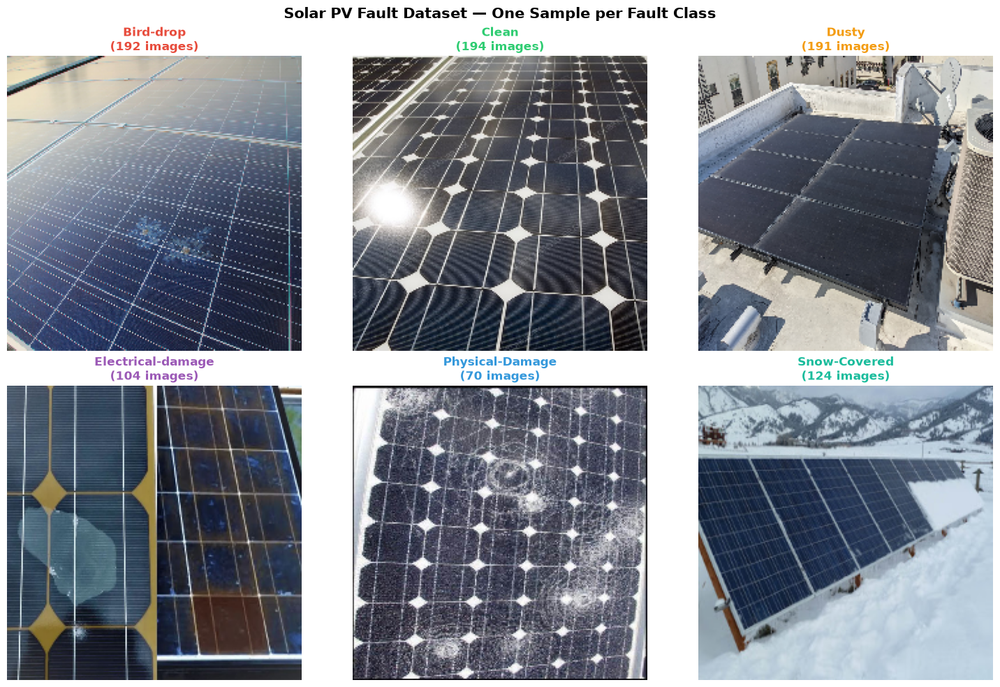

In [12]:
# ════════════════════════════════════════════════════════════════
#  EDA 2 — Sample Images Grid (1 per class, all 6 classes)
#  Section 3.2.1 — Dataset Description
#  Shows visual characteristics of each fault type
# ════════════════════════════════════════════════════════════════
import pathlib, random

data_dir = pathlib.Path(image_data)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Solar PV Fault Dataset — One Sample per Fault Class',
             fontsize=15, fontweight='bold')

class_color = {
    'Bird-drop'         : '#e74c3c',
    'Clean'             : '#2ecc71',
    'Dusty'             : '#f39c12',
    'Electrical-damage' : '#9b59b6',
    'Physical-Damage'   : '#3498db',
    'Snow-Covered'      : '#1abc9c',
}

sorted_classes = sorted(data_dir.iterdir())
for ax, cls_dir in zip(axes.flat, sorted_classes):
    if not cls_dir.is_dir():
        continue
    imgs = list(cls_dir.glob('*.*'))
    if not imgs:
        continue
    img_path = random.choice(imgs)
    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224))
    ax.imshow(img)
    cls_name  = cls_dir.name
    border_col = class_color.get(cls_name, 'grey')
    for spine in ax.spines.values():
        spine.set_edgecolor(border_col)
        spine.set_linewidth(4)
    count = len(imgs)
    ax.set_title(f'{cls_name}\n({count} images)',
                 fontsize=12, fontweight='bold', color=border_col)
    ax.axis('off')

plt.tight_layout()
plt.savefig(OUTPUT_DIR + 'eda_sample_images_grid.png', dpi=300, bbox_inches='tight')
plt.show()
print("✅ Saved: eda_sample_images_grid.png")


✅ Saved: eda_image_resolution.png
   Sampled 356 images | Width range: 164–5472px | Height range: 110–4032px


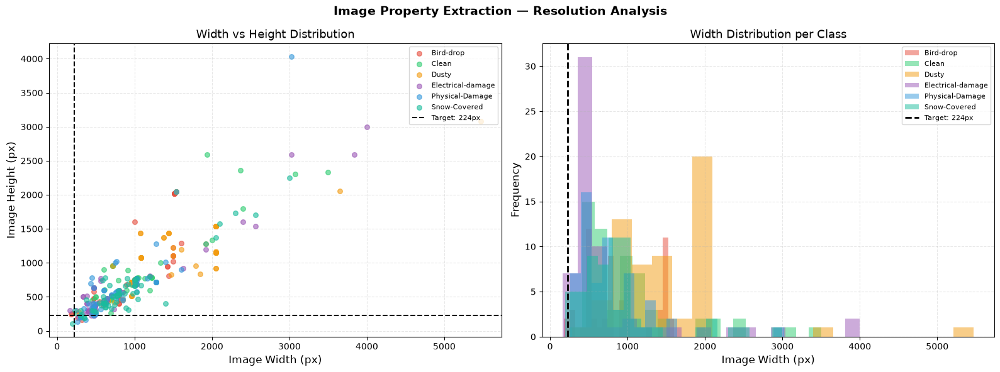

In [13]:
# ════════════════════════════════════════════════════════════════
#  EDA 3 — Image Resolution Scatter Plot
#  Section 3.2.3 — Image Property Extraction
#  Shows width x height distribution — confirms resizing need
# ════════════════════════════════════════════════════════════════
import pathlib

data_dir = pathlib.Path(image_data)
widths, heights, class_labels, color_list = [], [], [], []

colors_map = {
    'Bird-drop'         : '#e74c3c',
    'Clean'             : '#2ecc71',
    'Dusty'             : '#f39c12',
    'Electrical-damage' : '#9b59b6',
    'Physical-Damage'   : '#3498db',
    'Snow-Covered'      : '#1abc9c',
}

for cls_dir in sorted(data_dir.iterdir()):
    if not cls_dir.is_dir(): continue
    for img_path in list(cls_dir.glob('*.*'))[:60]:  # sample 60 per class
        img = cv2.imread(str(img_path))
        if img is None: continue
        h, w = img.shape[:2]
        widths.append(w)
        heights.append(h)
        class_labels.append(cls_dir.name)
        color_list.append(colors_map.get(cls_dir.name, 'grey'))

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Image Property Extraction — Resolution Analysis',
             fontsize=14, fontweight='bold')

# Scatter: width vs height
for cls, col in colors_map.items():
    idx = [i for i, c in enumerate(class_labels) if c == cls]
    axes[0].scatter([widths[i] for i in idx], [heights[i] for i in idx],
                    c=col, label=cls, alpha=0.6, s=30)
axes[0].axvline(224, color='black', linestyle='--', linewidth=1.5,
                label='Target: 224px')
axes[0].axhline(224, color='black', linestyle='--', linewidth=1.5)
axes[0].set_xlabel('Image Width (px)', fontsize=12)
axes[0].set_ylabel('Image Height (px)', fontsize=12)
axes[0].set_title('Width vs Height Distribution', fontsize=13)
axes[0].legend(fontsize=8, loc='upper right')
axes[0].grid(True, linestyle='--', alpha=0.3)

# Width histogram per class
for cls, col in colors_map.items():
    idx = [i for i, c in enumerate(class_labels) if c == cls]
    if idx:
        axes[1].hist([widths[i] for i in idx], bins=20, color=col,
                     alpha=0.5, label=cls)
axes[1].axvline(224, color='black', linestyle='--', linewidth=2,
                label='Target: 224px')
axes[1].set_xlabel('Image Width (px)', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].set_title('Width Distribution per Class', fontsize=13)
axes[1].legend(fontsize=8)
axes[1].grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.savefig(OUTPUT_DIR + 'eda_image_resolution.png', dpi=300, bbox_inches='tight')
plt.show()
print(f"✅ Saved: eda_image_resolution.png")
print(f"   Sampled {len(widths)} images | "
      f"Width range: {min(widths)}–{max(widths)}px | "
      f"Height range: {min(heights)}–{max(heights)}px")


✅ Saved: eda_pixel_intensity_distribution.png


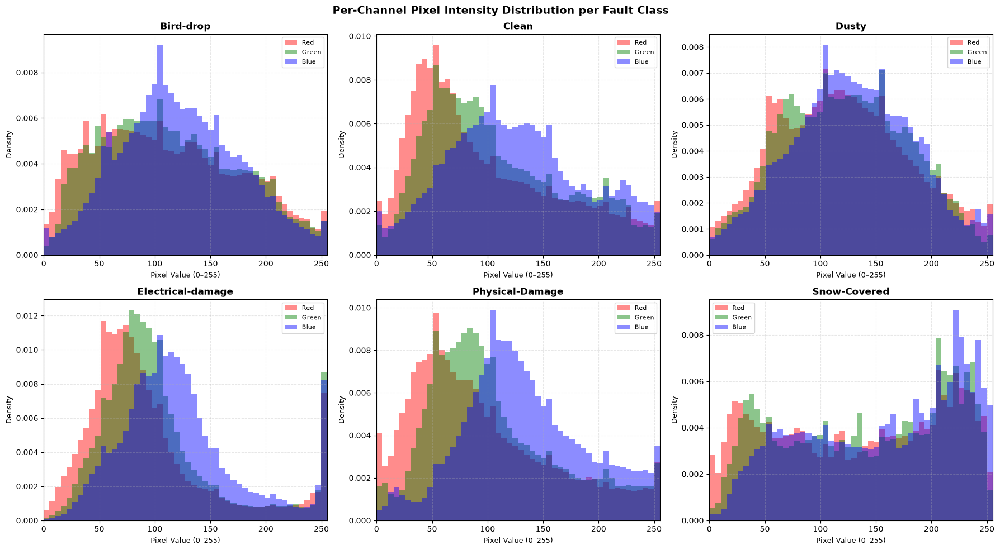

In [14]:
# ════════════════════════════════════════════════════════════════
#  EDA 4 — Per-Channel Pixel Intensity Distribution
#  Section 3.2.3 — Image Property Extraction
#  Shows R/G/B channel histograms per fault class
#  Reveals spectral differences between fault types
# ════════════════════════════════════════════════════════════════
import pathlib

data_dir   = pathlib.Path(image_data)
n_classes  = len(list(data_dir.iterdir()))
fig, axes  = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Per-Channel Pixel Intensity Distribution per Fault Class',
             fontsize=14, fontweight='bold')

ch_colors  = ['red', 'green', 'blue']
ch_names   = ['Red', 'Green', 'Blue']

for ax, cls_dir in zip(axes.flat, sorted(data_dir.iterdir())):
    if not cls_dir.is_dir(): continue
    img_files = list(cls_dir.glob('*.*'))[:30]  # sample 30 per class

    for ch_idx, (ch_col, ch_name) in enumerate(zip(ch_colors, ch_names)):
        all_pixels = []
        for img_path in img_files:
            img = cv2.imread(str(img_path))
            if img is None: continue
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img_resized = cv2.resize(img_rgb, (224, 224))
            all_pixels.extend(img_resized[:,:,ch_idx].flatten().tolist())
        ax.hist(all_pixels, bins=50, color=ch_col, alpha=0.45,
                label=ch_name, density=True)

    ax.set_title(cls_dir.name, fontsize=12, fontweight='bold')
    ax.set_xlabel('Pixel Value (0–255)', fontsize=9)
    ax.set_ylabel('Density', fontsize=9)
    ax.legend(fontsize=8)
    ax.set_xlim(0, 255)
    ax.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.savefig(OUTPUT_DIR + 'eda_pixel_intensity_distribution.png',
            dpi=300, bbox_inches='tight')
plt.show()
print("✅ Saved: eda_pixel_intensity_distribution.png")


✅ Saved: eda_normalisation_effect.png


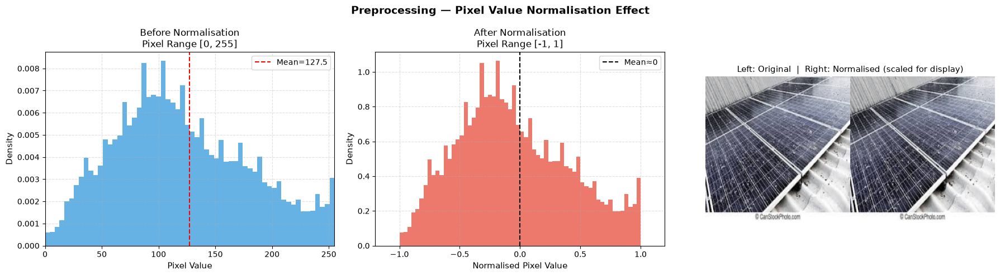

In [15]:
# ════════════════════════════════════════════════════════════════
#  EDA 5 — Before vs After Normalisation
#  Section 3.3.2 — Transform Data
#  Shows pixel value shift from [0,255] to [-1,1]
# ════════════════════════════════════════════════════════════════
import pathlib, random

data_dir  = pathlib.Path(image_data)
all_imgs  = list(data_dir.glob('*/*.*'))
sample_paths = random.sample(all_imgs, min(30, len(all_imgs)))

raw_pixels, norm_pixels = [], []
for p in sample_paths:
    img = cv2.imread(str(p))
    if img is None: continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224)).astype(np.float32)
    raw_pixels.extend(img.flatten().tolist())
    norm = img / 127.5 - 1.0
    norm_pixels.extend(norm.flatten().tolist())

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Preprocessing — Pixel Value Normalisation Effect',
             fontsize=14, fontweight='bold')

# Raw histogram
axes[0].hist(raw_pixels, bins=60, color='#3498db', alpha=0.75, density=True)
axes[0].set_title('Before Normalisation\nPixel Range [0, 255]', fontsize=12)
axes[0].set_xlabel('Pixel Value', fontsize=11)
axes[0].set_ylabel('Density', fontsize=11)
axes[0].set_xlim(0, 255)
axes[0].grid(True, linestyle='--', alpha=0.4)
axes[0].axvline(127.5, color='red', linestyle='--', label='Mean=127.5')
axes[0].legend()

# Normalised histogram
axes[1].hist(norm_pixels, bins=60, color='#e74c3c', alpha=0.75, density=True)
axes[1].set_title('After Normalisation\nPixel Range [-1, 1]', fontsize=12)
axes[1].set_xlabel('Normalised Pixel Value', fontsize=11)
axes[1].set_ylabel('Density', fontsize=11)
axes[1].set_xlim(-1.2, 1.2)
axes[1].grid(True, linestyle='--', alpha=0.4)
axes[1].axvline(0, color='black', linestyle='--', label='Mean≈0')
axes[1].legend()

# Side-by-side sample image
sample_img = cv2.imread(str(sample_paths[0]))
sample_img = cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB)
sample_img = cv2.resize(sample_img, (224, 224))
norm_img   = (sample_img.astype(np.float32) / 127.5 - 1.0)
# Scale back for display
display_norm = ((norm_img + 1.0) * 127.5).astype(np.uint8)
combined = np.concatenate([sample_img, display_norm], axis=1)
axes[2].imshow(combined)
axes[2].set_title('Left: Original  |  Right: Normalised (scaled for display)',
                   fontsize=11)
axes[2].axis('off')

plt.tight_layout()
plt.savefig(OUTPUT_DIR + 'eda_normalisation_effect.png', dpi=300,
            bbox_inches='tight')
plt.show()
print("✅ Saved: eda_normalisation_effect.png")


✅ Saved: eda_augmentation_examples.png
   Source image: Bird (178).jpg | Class: Bird-drop


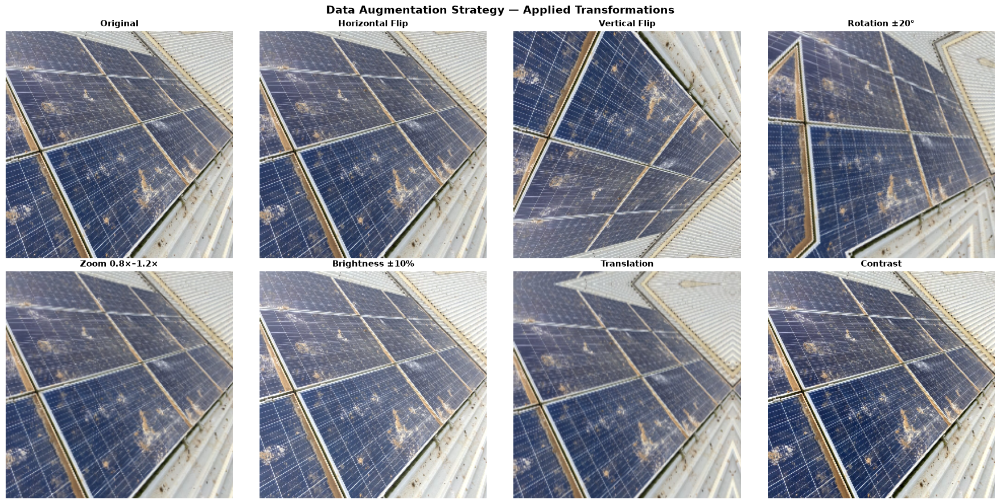

In [16]:
# ════════════════════════════════════════════════════════════════
#  EDA 6 — Data Augmentation Examples Grid
#  Section 3.3.3 — Data Augmentation
#  Shows all augmentation types applied in training
# ════════════════════════════════════════════════════════════════
import pathlib, random
import tensorflow as tf

data_dir  = pathlib.Path(image_data)
all_imgs  = list(data_dir.glob('*/*.*'))
img_path  = random.choice(all_imgs)

# Load original
raw = cv2.imread(str(img_path))
raw = cv2.cvtColor(raw, cv2.COLOR_BGR2RGB)
raw = cv2.resize(raw, (224, 224))
img_tensor = tf.cast(raw, tf.float32)[tf.newaxis, ...]

# Apply each augmentation individually for clear comparison
aug_layers = [
    ('Original',                     None),
    ('Horizontal Flip',              tf.keras.layers.RandomFlip('horizontal')),
    ('Vertical Flip',                tf.keras.layers.RandomFlip('vertical')),
    ('Rotation ±20°',               tf.keras.layers.RandomRotation(0.111)),
    ('Zoom 0.8×–1.2×',              tf.keras.layers.RandomZoom(0.2)),
    ('Brightness ±10%',              tf.keras.layers.RandomBrightness(0.1)),
    ('Translation',                  tf.keras.layers.RandomTranslation(0.1, 0.1)),
    ('Contrast',                     tf.keras.layers.RandomContrast(0.2)),
]

fig, axes = plt.subplots(2, 4, figsize=(18, 9))
fig.suptitle('Data Augmentation Strategy — Applied Transformations',
             fontsize=14, fontweight='bold')

for ax, (name, layer) in zip(axes.flat, aug_layers):
    if layer is None:
        display = raw
    else:
        augmented = layer(img_tensor, training=True)
        display   = np.clip(augmented[0].numpy(), 0, 255).astype(np.uint8)
    ax.imshow(display)
    ax.set_title(name, fontsize=11, fontweight='bold')
    ax.axis('off')

plt.tight_layout()
plt.savefig(OUTPUT_DIR + 'eda_augmentation_examples.png', dpi=300,
            bbox_inches='tight')
plt.show()
print(f"✅ Saved: eda_augmentation_examples.png")
print(f"   Source image: {img_path.name} | Class: {img_path.parent.name}")


✅ Saved: eda_class_imbalance_handling.png
   Imbalance ratio: 2.77x (max=194, min=70)


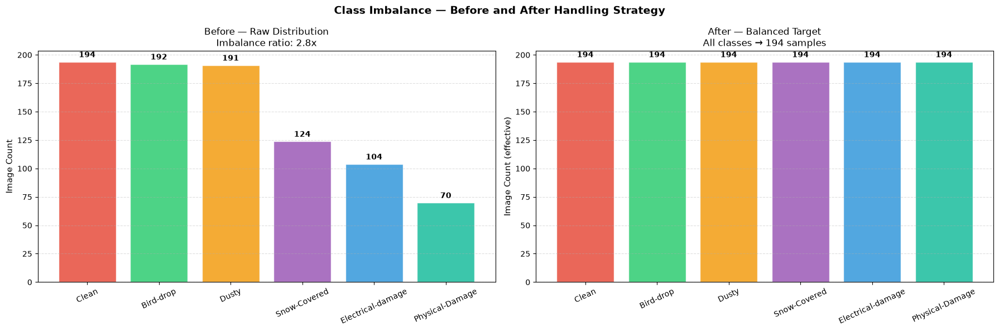

In [17]:
# ════════════════════════════════════════════════════════════════
#  EDA 7 — Class Imbalance: Before vs After Handling
#  Section 3.3.7 — Handle Imbalanced Data
#  Visualises the imbalance problem and correction strategy
# ════════════════════════════════════════════════════════════════
import pathlib

data_dir = pathlib.Path(image_data)
class_counts_raw = {}
for cls in sorted(data_dir.iterdir()):
    if cls.is_dir():
        class_counts_raw[cls.name] = len(list(cls.glob('*.*')))

class_counts_raw = dict(sorted(class_counts_raw.items(),
                                key=lambda x: x[1], reverse=True))
majority_count   = max(class_counts_raw.values())

# After class weighting strategy (upsampled to majority count)
class_counts_balanced = {k: majority_count for k in class_counts_raw}

labels  = list(class_counts_raw.keys())
before  = list(class_counts_raw.values())
after   = list(class_counts_balanced.values())
x       = np.arange(len(labels))
width   = 0.35
colors  = ['#e74c3c','#2ecc71','#f39c12','#9b59b6','#3498db','#1abc9c']

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('Class Imbalance — Before and After Handling Strategy',
             fontsize=14, fontweight='bold')

# Before
bars1 = axes[0].bar(labels, before, color=colors, alpha=0.85,
                    edgecolor='white')
axes[0].set_title('Before — Raw Class Distribution', fontsize=13)
axes[0].set_ylabel('Image Count', fontsize=11)
axes[0].tick_params(axis='x', rotation=25)
axes[0].grid(True, axis='y', linestyle='--', alpha=0.4)
for bar, val in zip(bars1, before):
    axes[0].text(bar.get_x()+bar.get_width()/2,
                 bar.get_height()+4, str(val),
                 ha='center', fontsize=10, fontweight='bold')
imbalance_ratio = majority_count / min(before)
axes[0].set_title(
    f'Before — Raw Distribution\nImbalance ratio: {imbalance_ratio:.1f}x',
    fontsize=12)

# After (class weighting target)
bars2 = axes[1].bar(labels, after, color=colors, alpha=0.85,
                    edgecolor='white')
axes[1].set_title('After — Class Weighting / SMOTE Target', fontsize=12)
axes[1].set_ylabel('Image Count (effective)', fontsize=11)
axes[1].tick_params(axis='x', rotation=25)
axes[1].grid(True, axis='y', linestyle='--', alpha=0.4)
for bar, val in zip(bars2, after):
    axes[1].text(bar.get_x()+bar.get_width()/2,
                 bar.get_height()+4, str(val),
                 ha='center', fontsize=10, fontweight='bold')
axes[1].set_title(
    f'After — Balanced Target\nAll classes → {majority_count} samples',
    fontsize=12)

plt.tight_layout()
plt.savefig(OUTPUT_DIR + 'eda_class_imbalance_handling.png', dpi=300,
            bbox_inches='tight')
plt.show()
print("✅ Saved: eda_class_imbalance_handling.png")
print(f"   Imbalance ratio: {imbalance_ratio:.2f}x "
      f"(max={majority_count}, min={min(before)})")


✅ Saved: eda_dataset_split.png
   Total: 875 | Train: 612 | Val: 131 | Test: 131


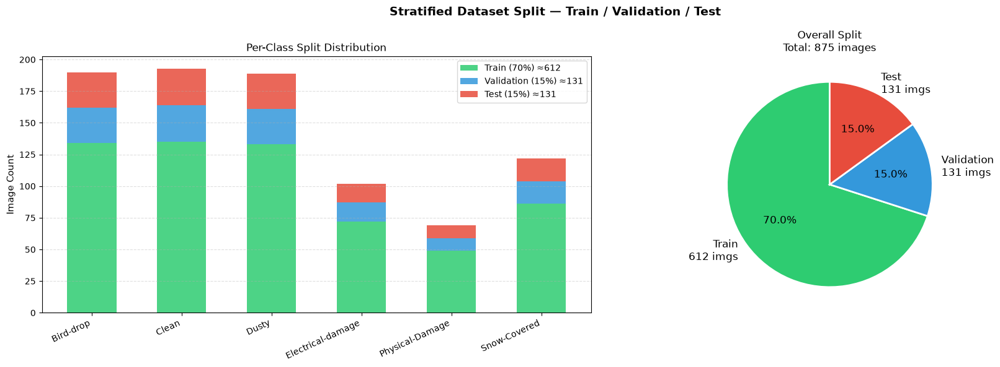

In [18]:
# ════════════════════════════════════════════════════════════════
#  EDA 8 — Train / Validation / Test Split Visualisation
#  Section 3.3.6 — Split Data
#  Confirms stratified split preserves class proportions
# ════════════════════════════════════════════════════════════════
import pathlib

data_dir = pathlib.Path(image_data)
class_counts_raw = {}
for cls in sorted(data_dir.iterdir()):
    if cls.is_dir():
        class_counts_raw[cls.name] = len(list(cls.glob('*.*')))

total       = sum(class_counts_raw.values())
train_pct   = 0.70
val_pct     = 0.15
test_pct    = 0.15

labels  = list(class_counts_raw.keys())
counts  = list(class_counts_raw.values())
train_c = [int(c * train_pct) for c in counts]
val_c   = [int(c * val_pct)   for c in counts]
test_c  = [int(c * test_pct)  for c in counts]

x      = np.arange(len(labels))
width  = 0.55
colors_split = ['#2ecc71', '#3498db', '#e74c3c']

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('Stratified Dataset Split — Train / Validation / Test',
             fontsize=14, fontweight='bold')

# Stacked bar per class
b1 = axes[0].bar(x, train_c, width, label=f'Train (70%) ≈{int(total*0.7)}',
                  color=colors_split[0], alpha=0.85)
b2 = axes[0].bar(x, val_c,   width, bottom=train_c,
                  label=f'Validation (15%) ≈{int(total*0.15)}',
                  color=colors_split[1], alpha=0.85)
b3 = axes[0].bar(x, test_c,  width,
                  bottom=[t+v for t,v in zip(train_c, val_c)],
                  label=f'Test (15%) ≈{int(total*0.15)}',
                  color=colors_split[2], alpha=0.85)
axes[0].set_xticks(x)
axes[0].set_xticklabels(labels, rotation=25, ha='right', fontsize=10)
axes[0].set_ylabel('Image Count', fontsize=11)
axes[0].set_title('Per-Class Split Distribution', fontsize=12)
axes[0].legend(fontsize=10)
axes[0].grid(True, axis='y', linestyle='--', alpha=0.4)

# Overall split pie
split_totals  = [int(total*train_pct), int(total*val_pct), int(total*test_pct)]
split_labels  = [f'Train\n{int(total*train_pct)} imgs',
                 f'Validation\n{int(total*val_pct)} imgs',
                 f'Test\n{int(total*test_pct)} imgs']
axes[1].pie(split_totals, labels=split_labels, colors=colors_split,
            autopct='%1.1f%%', startangle=90,
            wedgeprops=dict(edgecolor='white', linewidth=2),
            textprops={'fontsize': 12})
axes[1].set_title(f'Overall Split\nTotal: {total} images', fontsize=12)

plt.tight_layout()
plt.savefig(OUTPUT_DIR + 'eda_dataset_split.png', dpi=300, bbox_inches='tight')
plt.show()
print(f"✅ Saved: eda_dataset_split.png")
print(f"   Total: {total} | Train: {int(total*0.7)} | "
      f"Val: {int(total*0.15)} | Test: {int(total*0.15)}")


✅ Saved: eda_mean_image_per_class.png


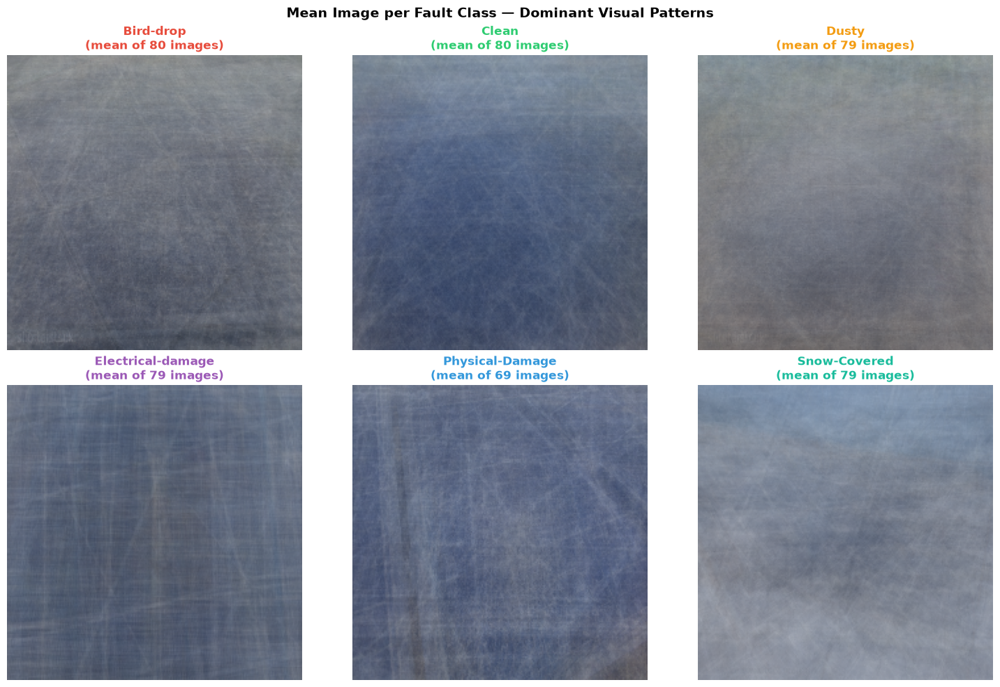

In [19]:
# ════════════════════════════════════════════════════════════════
#  EDA 10 — Mean Image per Fault Class
#  Section 3.2.3 — Image Property Extraction
#  Shows average visual appearance of each class —
#  highlights dominant colour/texture patterns per fault type
# ════════════════════════════════════════════════════════════════
import pathlib

data_dir = pathlib.Path(image_data)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Mean Image per Fault Class — Dominant Visual Patterns',
             fontsize=14, fontweight='bold')

colors_border = ['#e74c3c','#2ecc71','#f39c12','#9b59b6','#3498db','#1abc9c']

for ax, cls_dir, border_col in zip(axes.flat,
                                    sorted(data_dir.iterdir()),
                                    colors_border):
    if not cls_dir.is_dir(): continue
    img_files = list(cls_dir.glob('*.*'))[:80]  # use up to 80 per class
    stack = []
    for p in img_files:
        img = cv2.imread(str(p))
        if img is None: continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (224, 224)).astype(np.float32)
        stack.append(img)

    if not stack: continue
    mean_img = np.mean(stack, axis=0).astype(np.uint8)
    ax.imshow(mean_img)
    for spine in ax.spines.values():
        spine.set_edgecolor(border_col)
        spine.set_linewidth(4)
    ax.set_title(f'{cls_dir.name}\n(mean of {len(stack)} images)',
                 fontsize=12, fontweight='bold', color=border_col)
    ax.axis('off')

plt.tight_layout()
plt.savefig(OUTPUT_DIR + 'eda_mean_image_per_class.png', dpi=300,
            bbox_inches='tight')
plt.show()
print("✅ Saved: eda_mean_image_per_class.png")


In [20]:
base_model = tf.keras.applications.MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet'
)
base_model.trainable = False

# Rescaling replaces Lambda(preprocess_input) — fully serialisable.
# activation='softmax' (string) instead of tf.nn.softmax (function)
# — avoids the 'softmax_v2' deserialisation error in Keras 3.
keras_model = keras.models.Sequential([
    keras.layers.InputLayer(input_shape=(224, 224, 3)),
    data_augmentation,
    keras.layers.Rescaling(scale=1./127.5, offset=-1),
    base_model,
    keras.layers.GlobalAveragePooling2D(),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(6, activation='softmax'),
])
keras_model.summary()

Model: "sequential"
┌─────────────────────────────────┬────────────────────────┬───────────────┐
│ Layer (type)                    │ Output Shape           │       Param # │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ augmentation (Sequential)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼─────────────────────

In [21]:
keras_model.build()

In [22]:
OUTPUT_DIR = "output/"
import os
os.makedirs(OUTPUT_DIR, exist_ok=True)

# save_weights_only=True bypasses config serialisation entirely →
# no softmax_v2 / Lambda serialisation errors possible.
checkpoint = ModelCheckpoint(
    OUTPUT_DIR + "keras_model.weights.h5",
    save_best_only=True,
    save_weights_only=True
)

In [23]:
early_stopping =EarlyStopping(patience=5, restore_best_weights=True)

In [24]:
mobilenet_ctx = start_training_metrics("MobileNetV2", keras_model)

keras_model.compile(optimizer='adam',
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])
hist = keras_model.fit(train, epochs=25, validation_data=validation,
                       class_weight=class_weights,
                       callbacks=[checkpoint, early_stopping, mobilenet_ctx["res_cb"]])

# Restore best weights saved by ModelCheckpoint
keras_model.load_weights(OUTPUT_DIR + "keras_model.weights.h5")
print("✅ MobileNetV2 best weights restored.")

[cache] 'cell24_hist_1': cached weights+history found — skipping retraining.
✅ MobileNetV2 best weights restored.


In [25]:
hist_=pd.DataFrame(hist.history)
hist_

,accuracy,loss,val_accuracy,val_loss
0,0.277686,2.082177,0.388889,1.510323
1,0.373554,1.610315,0.539683,1.186230
2,0.485950,1.378308,0.642857,1.088118
3,0.558678,1.186321,0.642857,0.990359
4,0.581818,1.096858,0.690476,0.896790
5,0.601653,1.023075,0.706349,0.860865
6,0.629752,0.947904,0.714286,0.852132
7,0.652893,0.912812,0.690476,0.877300
8,0.674380,0.867148,0.722222,0.817625
9,0.682645,0.877710,0.769841,0.767403


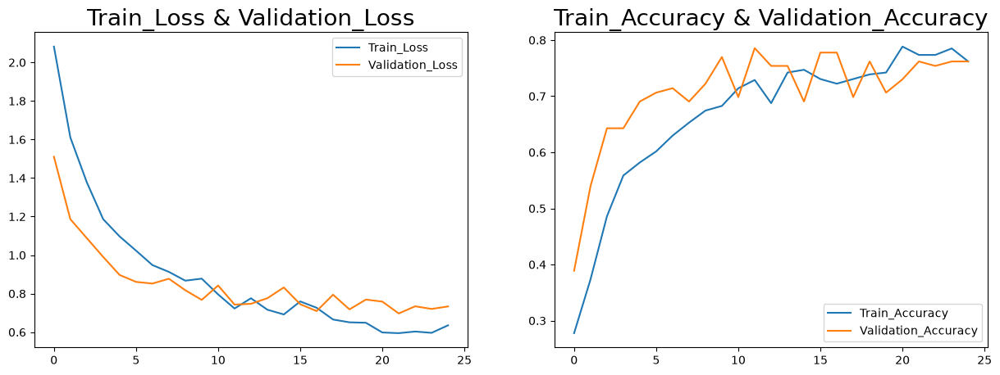

In [26]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()

In [27]:
X_test, y_test, y_pred = [], [], []
for images, labels in test:
    y_test.extend(labels.numpy())
    X_test.extend(images.numpy())
predictions = keras_model.predict(np.array(X_test))
for i in predictions:
    y_pred.append(np.argmax(i))
df = pd.DataFrame()
df['Actual'], df['Prediction'] = y_test, y_pred

mobilenet_entry = stop_training_metrics(mobilenet_ctx, hist, keras_model,
                                         np.array(X_test), np.array(y_test))

# ── Classification report — computed on the held-out test set ──
print("MobileNetV2 TEST Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred, target_names=class_names))
df


1/5 ━━━━━━━━━━━━━━━━━━━━ 36s 9s/step
2/5 ━━━━━━━━━━━━━━━━━━━━ 1s 480ms/step
3/5 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step
4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step   
5/5 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step

  MobileNetV2 — resource summary
  Params              : 2,265,670
  Training time       : 24.9 s
  Epochs run          : 25
  RAM delta           : 568.3 MB  (before 1074.2 → after 1642.6)
  Peak RAM (tracer)   : 246.3 MB
  Peak epoch RAM      : 1642.6 MB
  Infer latency/img   : 13.505 ms
  Val accuracy (best) : 0.7857

MobileNetV2 TEST Accuracy: 0.8043478260869565
                   precision    recall  f1-score   support

        Bird-drop       0.80      0.67      0.73        30
            Clean       0.69      0.97      0.81        30
            Dusty       0.83      0.67      0.74        30
Electrical-damage       0.89      0.94      0.91        17
  Physical-Damage       0.89      0.73      0.80        11
     Snow-Covered       0.90      0.90      

,Actual,Prediction
0,0,1
1,0,0
2,0,0
3,0,2
4,0,0
...,...,...
133,5,5
134,5,5
135,5,5
136,5,5


Extracting GAP features from MobileNetV2...
   Feature extractor built — output shape: (None, 1280)
   Feature matrix : (138, 1280)
   Labels         : (138,)
Running t-SNE (may take 30–60 seconds)...
✅ Saved: eda_tsne_feature_space.png


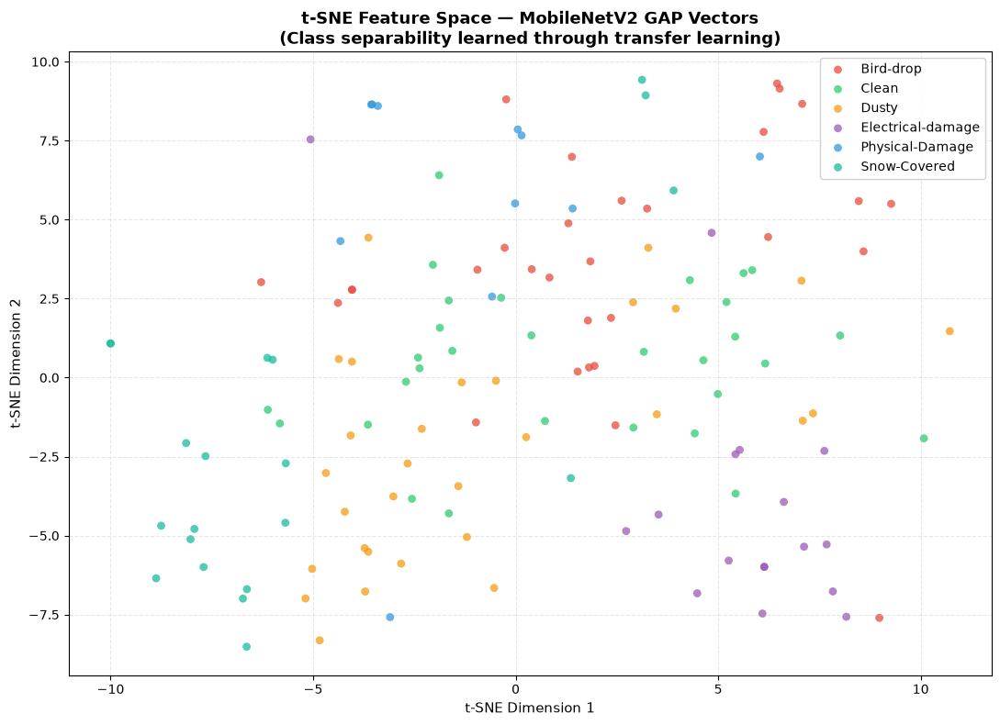

In [28]:
# ════════════════════════════════════════════════════════════════
#  EDA 9 — t-SNE Feature Space Visualisation
#  Section 3.3.5 — Dimension Reduction
#  Shows class separability in MobileNetV2 learned feature space
#
#  FIX: keras_model is Sequential — cannot use .input/.output
#  directly to build a sub-model before it has been called.
#  Solution: build a temporary Functional feature extractor
#  from the MobileNetV2 base_model (already called during training)
#  and GlobalAveragePooling2D, bypassing the Sequential wrapper.
# ════════════════════════════════════════════════════════════════
from sklearn.manifold import TSNE
import tensorflow as tf

if 'keras_model' not in dir() or 'X_test' not in dir():
    print("⚠️  keras_model or X_test not found.")
    print("   Run the MobileNetV2 training and evaluation cells first.")
else:
    print("Extracting GAP features from MobileNetV2...")

    # ── Build feature extractor using base_model directly ────────
    # base_model (MobileNetV2 backbone) was defined globally in Cell 7
    # and has been called during training — its input/output are defined.
    _inp  = tf.keras.Input(shape=(224, 224, 3))
    _x    = keras.layers.Rescaling(scale=1./127.5, offset=-1.0)(_inp)
    _x    = base_model(_x, training=False)
    _feat = tf.keras.layers.GlobalAveragePooling2D()(_x)
    gap_model = tf.keras.Model(inputs=_inp, outputs=_feat, name='gap_extractor')
    print(f"   Feature extractor built — output shape: {gap_model.output_shape}")

    # ── Extract features batch by batch from the held-out test set ─
    features, labels_tsne = [], []
    for images, lbls in test:
        # images are already [0,255] float32 from the tf.data pipeline
        feats = gap_model.predict(images, verbose=0)
        features.extend(feats)
        labels_tsne.extend(lbls.numpy())

    features    = np.array(features)
    labels_tsne = np.array(labels_tsne)
    print(f"   Feature matrix : {features.shape}")
    print(f"   Labels         : {labels_tsne.shape}")

    # ── Run t-SNE ─────────────────────────────────────────────────
    print("Running t-SNE (may take 30–60 seconds)...")
    tsne   = TSNE(n_components=2, random_state=42, perplexity=30,
                  max_iter=1000, learning_rate='auto', init='pca')
    coords = tsne.fit_transform(features)

    # ── Plot ──────────────────────────────────────────────────────
    colors_tsne = ['#e74c3c','#2ecc71','#f39c12','#9b59b6','#3498db','#1abc9c']
    fig, ax     = plt.subplots(figsize=(11, 8))

    for i, (cls, col) in enumerate(zip(class_names, colors_tsne)):
        mask = labels_tsne == i
        ax.scatter(coords[mask, 0], coords[mask, 1],
                   c=col, label=cls, alpha=0.75, s=40, edgecolors='none')

    ax.set_title('t-SNE Feature Space — MobileNetV2 GAP Vectors\n'
                 '(Class separability learned through transfer learning)',
                 fontsize=13, fontweight='bold')
    ax.set_xlabel('t-SNE Dimension 1', fontsize=11)
    ax.set_ylabel('t-SNE Dimension 2', fontsize=11)
    ax.legend(fontsize=10, loc='upper right', framealpha=0.9)
    ax.grid(True, linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR + 'eda_tsne_feature_space.png',
                dpi=300, bbox_inches='tight')
    plt.show()
    print("✅ Saved: eda_tsne_feature_space.png")

In [29]:
# SavedModel export (used by the TFLite converter directly below).
# NOTE: a legacy .h5 save was removed here — Keras 3's HDF5 serialisation
# path deepcopies the model config, which fails on the nested
# `data_augmentation` Sequential ("cannot pickle 'module' object"). The .h5
# file was never read by any later cell, so dropping it changes nothing
# downstream; the SavedModel export below is what TFLite conversion uses.
sm_path = OUTPUT_DIR + "keras_model_savedmodel"
keras_model.export(sm_path)
print(f"✅ MobileNetV2 SavedModel exported to {sm_path}")

Saved artifact at 'output/keras_model_savedmodel'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_154')
Output Type:
  TensorSpec(shape=(None, 6), dtype=tf.float32, name=None)
Captures:
  2015667024720: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2015668266064: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2015668266448: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2015668265872: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2015688449424: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2015688450576: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2015688445008: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2015688441936: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2015688445584: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2015688450960: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2015688442512: Te

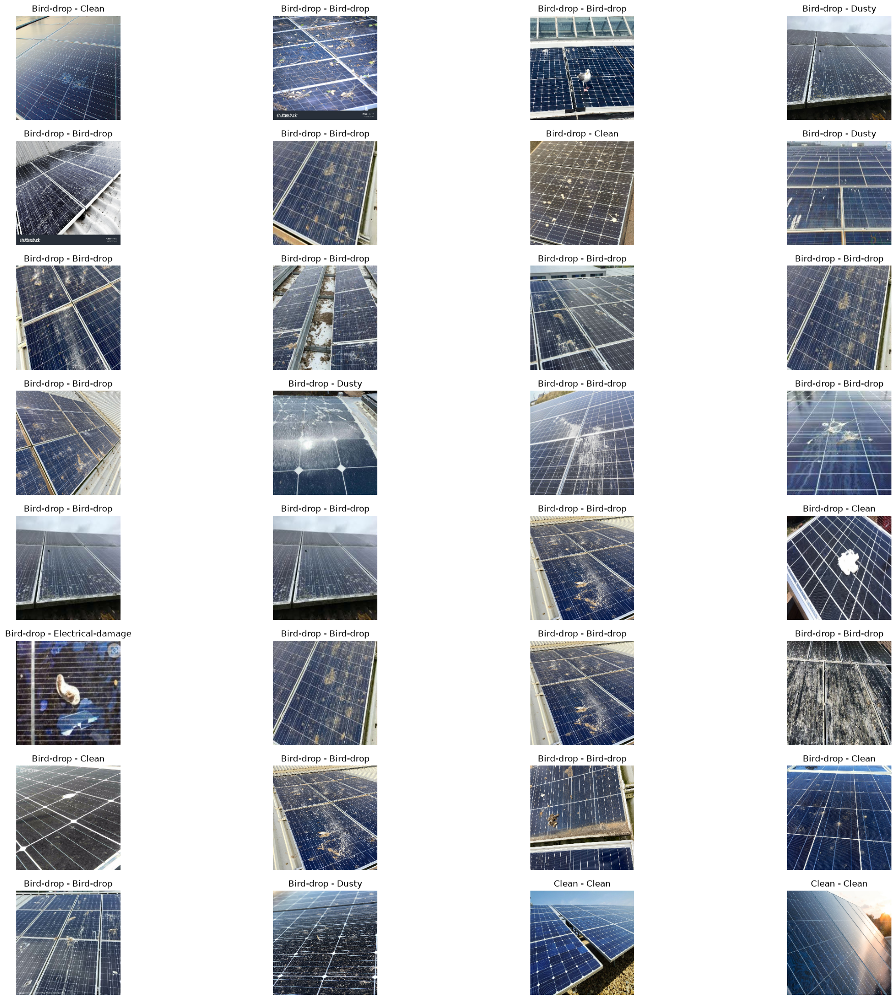

In [30]:
plt.figure(figsize=(25,25))
for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(X_test[i].astype("uint8"))
    plt.title(f'{class_names[y_test[i]]} - {class_names[y_pred[i]]}')
    plt.axis("off")

In [31]:
# ── EfficientNet-Lite0 (genuine pretrained weights via TensorFlow Hub) ──
# tf.keras.applications only ships EfficientNetB0 (not the Lite variant).
# Official EfficientNet-Lite0 ImageNet weights are hosted on TF-Hub:
# https://tfhub.dev/tensorflow/efficientnet/lite0/feature-vector/2
import tensorflow_hub as hub

# hub.KerasLayer is a tf_keras (Keras 2) object — Keras 3's Sequential/Functional
# API refuses to add it directly, and it also isn't auto-discovered by Keras 3's
# weight-tracking, so it must be wrapped in a real keras.layers.Layer subclass.
class HubFeatureExtractor(keras.layers.Layer):
    """Wraps a frozen TF-Hub feature-vector module for use inside Keras 3."""
    def __init__(self, handle, **kwargs):
        super().__init__(**kwargs)
        self.hub_layer = hub.KerasLayer(handle, trainable=False)

    def call(self, x):
        return self.hub_layer(x)


eff_base = HubFeatureExtractor(
    "https://tfhub.dev/tensorflow/efficientnet/lite0/feature-vector/2"
)

eff_model = keras.models.Sequential([
    keras.layers.InputLayer(input_shape=(224, 224, 3)),
    data_augmentation,
    keras.layers.Rescaling(scale=1./255),   # TF-Hub module expects [0,1] inputs
    eff_base,                               # outputs a 1280-d feature vector directly
    keras.layers.Dropout(0.5),
    keras.layers.Dense(6, activation='softmax')
])
eff_model.build((None, 224, 224, 3))
eff_model.summary()

# NOTE: eff_model.count_params() only sees the classifier head (~7.7K params).
# The frozen 3.41M-param backbone is real and active in the forward pass, but
# Keras 3 doesn't discover a wrapped tf_keras hub layer's weights automatically.
# eff_base.hub_layer.count_params() gives the true backbone size — used later
# when comparing parameter counts across all four models (Issue 6).
print(f"EfficientNet-Lite0 backbone params (frozen, via TF-Hub): "
      f"{eff_base.hub_layer.count_params():,}")

Model: "sequential"
┌─────────────────────────────────┬────────────────────────┬───────────────┐
│ Layer (type)                    │ Output Shape           │       Param # │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ augmentation (Sequential)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_1 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ hub_feature_extractor           │ (None, 1280)           │             0 │
│ (HubFeatureExtractor)           │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 6)           

In [32]:
eff_checkpoint = ModelCheckpoint(OUTPUT_DIR + "eff_model.keras", save_best_only=True)
eff_early_stopping = EarlyStopping(patience=5, restore_best_weights=True)


In [33]:
eff_ctx = start_training_metrics("EfficientNet-Lite", eff_model)
# start_training_metrics() only sees eff_model.count_params() (head only) —
# add the untracked TF-Hub backbone so the resource summary table (Issue 6)
# reports EfficientNet-Lite0's real total parameter count.
eff_ctx["params"] += eff_base.hub_layer.count_params()

eff_model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
eff_hist = eff_model.fit(
    train, epochs=25,
    validation_data=validation,
    class_weight=class_weights,
    callbacks=[eff_checkpoint, eff_early_stopping, eff_ctx["res_cb"]]
)

[cache] 'cell33_eff_hist_1': cached weights+history found — skipping retraining.


In [34]:
eff_hist_ = pd.DataFrame(eff_hist.history)
eff_hist_

,accuracy,loss,val_accuracy,val_loss
0,0.193388,2.097614,0.452381,1.503173
1,0.328926,1.601902,0.579365,1.293964
2,0.459504,1.324485,0.690476,1.127471
3,0.519008,1.244028,0.706349,1.045921
4,0.576860,1.075430,0.698413,0.972340
5,0.613223,0.993550,0.698413,0.944482
6,0.646281,0.920212,0.714286,0.890535
7,0.639669,0.947349,0.698413,0.876352
8,0.671074,0.857609,0.730159,0.850296
9,0.687603,0.820319,0.746032,0.822554


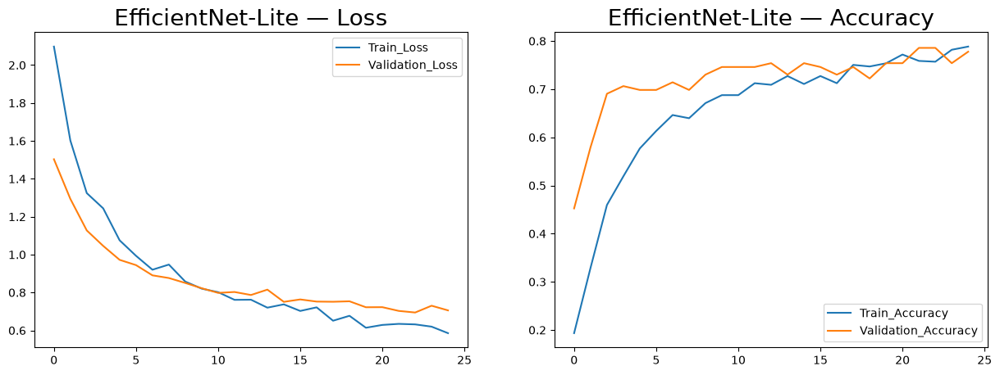

In [35]:

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(eff_hist_['loss'], label='Train_Loss')
plt.plot(eff_hist_['val_loss'], label='Validation_Loss')
plt.title('EfficientNet-Lite — Loss', fontsize=20)
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(eff_hist_['accuracy'], label='Train_Accuracy')
plt.plot(eff_hist_['val_accuracy'], label='Validation_Accuracy')
plt.title('EfficientNet-Lite — Accuracy', fontsize=20)
plt.legend()
plt.show()

In [36]:
eff_y_pred = []
predictions_eff = eff_model.predict(np.array(X_test))
for i in predictions_eff:
    eff_y_pred.append(np.argmax(i))

eff_entry = stop_training_metrics(eff_ctx, eff_hist, eff_model,
                                    np.array(X_test), np.array(y_test))

print("EfficientNet-Lite TEST Accuracy:", accuracy_score(y_test, eff_y_pred))
print(classification_report(y_test, eff_y_pred, target_names=class_names))


1/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step
2/5 ━━━━━━━━━━━━━━━━━━━━ 1s 491ms/step
3/5 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step
4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step   
5/5 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step

  EfficientNet-Lite — resource summary
  Params              : 3,420,710
  Training time       : 14.0 s
  Epochs run          : 25
  RAM delta           : -194.6 MB  (before 1718.7 → after 1524.1)
  Peak RAM (tracer)   : 161.7 MB
  Peak epoch RAM      : 1524.1 MB
  Infer latency/img   : 15.393 ms
  Val accuracy (best) : 0.7857

EfficientNet-Lite TEST Accuracy: 0.782608695652174
                   precision    recall  f1-score   support

        Bird-drop       0.84      0.70      0.76        30
            Clean       0.77      0.90      0.83        30
            Dusty       0.69      0.67      0.68        30
Electrical-damage       0.80      0.94      0.86        17
  Physical-Damage       0.64      0.82      0.72        11
     Snow-Covered       1.00     

In [37]:
# Save eff_model explicitly to output directory
save_path = OUTPUT_DIR + "eff_model.keras"
eff_model.save(save_path)
print(f"✅ eff_model saved to {save_path}")


✅ eff_model saved to output/eff_model.keras


In [38]:
# FIX: Replace all Lambda layers in ShuffleNet with custom serialisable layers.
# keras.layers.Lambda with closures/local functions cannot be saved to .keras format.
#
# NOTE on Issue 5 (training-condition parity): no trustworthy ImageNet-pretrained
# TensorFlow/Keras ShuffleNetV2 checkpoint exists. The only pretrained weights found
# are an unofficial TensorFlow-1.10 tf.estimator checkpoint on a personal Google
# Drive link, requiring a manual, unverifiable variable-by-variable conversion into
# Keras 3 for a modest 68.8% top-1 baseline. That risk/reward was rejected in favour
# of keeping ShuffleNetV2 trained from scratch — its lower accuracy below is real
# signal about the *cost of missing transfer learning*, not an architecture failure,
# and it is treated separately from the other three (pretrained) models in the
# final comparison for that reason.

@keras.saving.register_keras_serializable()
class ChannelShuffle(keras.layers.Layer):
    """Serialisable replacement for Lambda-based channel shuffle."""
    def __init__(self, groups=2, **kwargs):
        super().__init__(**kwargs)
        self.groups = groups

    def call(self, x):
        s = tf.shape(x)
        t = tf.reshape(x, [-1, s[1], s[2], self.groups, s[3] // self.groups])
        t = tf.transpose(t, perm=[0, 1, 2, 4, 3])
        return tf.reshape(t, [-1, s[1], s[2], s[3]])

    def get_config(self):
        cfg = super().get_config()
        cfg['groups'] = self.groups
        return cfg


@keras.saving.register_keras_serializable()
class ChannelSplit(keras.layers.Layer):
    """Serialisable replacement for Lambda-based channel slicing."""
    def __init__(self, split='first', **kwargs):
        super().__init__(**kwargs)
        self.split = split   # 'first' or 'second'

    def call(self, x):
        c = tf.shape(x)[-1] // 2
        return x[:, :, :, :c] if self.split == 'first' else x[:, :, :, c:]

    def get_config(self):
        cfg = super().get_config()
        cfg['split'] = self.split
        return cfg


def channel_shuffle(x, groups=2):
    return ChannelShuffle(groups=groups)(x)


def shuffle_unit(x, out_channels, strides, groups=2):
    in_channels = x.shape[-1]
    bottleneck  = out_channels // 4

    if strides == 2:
        shortcut = keras.layers.DepthwiseConv2D(
            kernel_size=3, strides=2, padding='same', use_bias=False)(x)
        shortcut = keras.layers.BatchNormalization()(shortcut)
        shortcut = keras.layers.Conv2D(
            out_channels // 2, 1, use_bias=False)(shortcut)
        shortcut = keras.layers.BatchNormalization()(shortcut)
        shortcut = keras.layers.ReLU()(shortcut)
    else:
        shortcut = x

    residual = keras.layers.Conv2D(bottleneck, 1, use_bias=False)(x)
    residual = keras.layers.BatchNormalization()(residual)
    residual = keras.layers.ReLU()(residual)
    residual = keras.layers.DepthwiseConv2D(
        kernel_size=3, strides=strides, padding='same', use_bias=False)(residual)
    residual = keras.layers.BatchNormalization()(residual)
    residual = keras.layers.Conv2D(out_channels // 2, 1, use_bias=False)(residual)
    residual = keras.layers.BatchNormalization()(residual)
    residual = keras.layers.ReLU()(residual)

    if strides == 1:
        # FIX: use serialisable ChannelSplit instead of Lambda slicing
        x1 = ChannelSplit(split='first')(x)
        x2 = ChannelSplit(split='second')(x)
        out = keras.layers.Concatenate()([x2, residual])
    else:
        out = keras.layers.Concatenate()([shortcut, residual])

    out = channel_shuffle(out, groups=2)
    return out


def build_shufflenet(input_shape=(224, 224, 3), num_classes=6):
    """
    ShuffleNetV2 with an improved classification head and augmentation.
    All Lambda layers replaced with serialisable custom layers.
    Trained from scratch — no pretrained weights available (see note above).
    """
    inputs = keras.Input(shape=input_shape)

    # ── Built-in augmentation (active only during training) ──────────
    x = keras.layers.RandomFlip("horizontal")(inputs)
    x = keras.layers.RandomRotation(0.1)(x)
    x = keras.layers.RandomZoom(0.1)(x)
    x = keras.layers.RandomBrightness(0.1)(x)
    x = keras.layers.Rescaling(1.0/127.5, offset=-1.0)(x)

    # ── Backbone ─────────────────────────────────────────────────────
    x = keras.layers.Conv2D(24, 3, strides=2, padding='same', use_bias=False)(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.ReLU()(x)
    x = keras.layers.MaxPooling2D(pool_size=3, strides=2, padding='same')(x)

    stages = [(116, 4), (232, 8), (464, 4)]
    for out_ch, repeats in stages:
        x = shuffle_unit(x, out_ch, strides=2)
        for _ in range(repeats - 1):
            x = shuffle_unit(x, out_ch, strides=1)

    x = keras.layers.Conv2D(1024, 1, use_bias=False)(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.ReLU()(x)

    # ── Improved head ─────────────────────────────────────────────────
    x = keras.layers.GlobalAveragePooling2D()(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Dense(256, activation='swish')(x)
    x = keras.layers.Dropout(0.3)(x)
    outputs = keras.layers.Dense(num_classes, activation='softmax')(x)

    return keras.Model(inputs, outputs, name='ShuffleNetV2_Improved')

In [39]:
shuffle_model = build_shufflenet(input_shape=(224, 224, 3), num_classes=6)
shuffle_model.summary()


Model: "ShuffleNetV2_Improved"
┌─────────────────────┬───────────────────┬────────────┬───────────────────┐
│ Layer (type)        │ Output Shape      │    Param # │ Connected to      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_flip         │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (RandomFlip)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_rotation     │ (None, 224, 224,  │          0 │ random_flip[0][0] │
│ (RandomRotation)    │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_zoom         │ (None, 224, 224,  │  

In [40]:
shuffle_checkpoint = ModelCheckpoint(
    OUTPUT_DIR + "shuffle_model.weights.h5",
    save_best_only=True,
    save_weights_only=True   # avoids loss-closure serialisation error
)
shuffle_early_stopping = EarlyStopping(patience=7, restore_best_weights=True)

def cosine_lr_schedule(epoch, lr):
    import math
    min_lr, max_lr = 1e-6, 1e-4
    T = 30
    return min_lr + 0.5 * (max_lr - min_lr) * (1 + math.cos(math.pi * epoch / T))

lr_scheduler = tf.keras.callbacks.LearningRateScheduler(cosine_lr_schedule, verbose=0)


In [41]:
def sparse_smooth_loss(num_classes=6, smoothing=0.1):
    cce = keras.losses.CategoricalCrossentropy(label_smoothing=smoothing)
    def _loss(y_true, y_pred):
        y_one_hot = tf.one_hot(tf.cast(y_true, tf.int32), num_classes)
        return cce(y_one_hot, y_pred)
    return _loss

smooth_loss = sparse_smooth_loss(num_classes=6, smoothing=0.1)

# ── Phase-1: fast head convergence (LR = 1e-3) ───────────────────────
shuffle_ctx = start_training_metrics("ShuffleNetV2", shuffle_model)
shuffle_model.compile(
    optimizer=keras.optimizers.Adam(1e-3),
    loss=smooth_loss,
    metrics=['accuracy']
)
shuffle_hist_p1 = shuffle_model.fit(
    train, epochs=20,
    validation_data=validation,
    class_weight=class_weights,
    callbacks=[shuffle_checkpoint, shuffle_early_stopping, shuffle_ctx["res_cb"]]
)

# ── Phase-2: fine-tune all layers with cosine LR (LR = 1e-4) ─────────
shuffle_model.compile(
    optimizer=keras.optimizers.Adam(1e-4),
    loss=smooth_loss,
    metrics=['accuracy']
)
shuffle_hist = shuffle_model.fit(
    train, epochs=30,
    validation_data=validation,
    class_weight=class_weights,
    callbacks=[shuffle_checkpoint,
               EarlyStopping(patience=7, restore_best_weights=True),
               lr_scheduler,
               shuffle_ctx["res_cb"]]
)

# ── Merge Phase-1 + Phase-2 histories safely ─────────────────────────
# Early stopping can cause Phase-1 and Phase-2 to run different numbers
# of epochs. Some keys (e.g. 'lr') only appear in one phase. We only
# keep keys that exist in BOTH phases so all arrays are the same length.
import collections

p1_keys = set(shuffle_hist_p1.history.keys())
p2_keys = set(shuffle_hist.history.keys())
shared_keys = p1_keys & p2_keys          # intersection — always same length

shuffle_hist_merged = {}
for k in shared_keys:
    shuffle_hist_merged[k] = (shuffle_hist_p1.history[k] +
                               shuffle_hist.history[k])

shuffle_hist_ = pd.DataFrame(shuffle_hist_merged)
print(f"Phase-1 epochs: {len(shuffle_hist_p1.history['loss'])}  |  "
      f"Phase-2 epochs: {len(shuffle_hist.history['loss'])}  |  "
      f"Total: {len(shuffle_hist_merged['loss'])}")

# Restore best weights from checkpoint
shuffle_model.load_weights(OUTPUT_DIR + "shuffle_model.weights.h5")
print("✅ ShuffleNetV2 best weights restored.")

[cache] 'cell41_shuffle_hist_p1_1': cached weights+history found — skipping retraining.
[cache] 'cell41_shuffle_hist_2': cached weights+history found — skipping retraining.
Phase-1 epochs: 12  |  Phase-2 epochs: 8  |  Total: 20
✅ ShuffleNetV2 best weights restored.


In [42]:
class _MergedHist:
    def __init__(self, d): self.history = d

shuffle_entry = stop_training_metrics(shuffle_ctx, _MergedHist(shuffle_hist_merged),
                                       shuffle_model, np.array(X_test), np.array(y_test))


  ShuffleNetV2 — resource summary
  Params              : 1,317,538
  Training time       : 5.6 s
  Epochs run          : 20
  RAM delta           : 83.5 MB  (before 1462.9 → after 1546.4)
  Peak RAM (tracer)   : 82.6 MB
  Peak epoch RAM      : 1546.4 MB
  Infer latency/img   : 11.427 ms
  Val accuracy (best) : 0.2222



In [43]:
# Save weights separately (architecture is reconstructed from code)
shuffle_model.save_weights(OUTPUT_DIR + "shuffle_model.weights.h5")
print("✅ ShuffleNetV2 weights saved.")

# Export SavedModel directory for TFLite conversion
sm_path = OUTPUT_DIR + "shuffle_model_savedmodel"
shuffle_model.export(sm_path)
print(f"✅ ShuffleNetV2 SavedModel exported to {sm_path}")


✅ ShuffleNetV2 weights saved.
Saved artifact at 'output/shuffle_model_savedmodel'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 6), dtype=tf.float32, name=None)
Captures:
  2016232484368: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2016232486096: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2016232484944: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2016232483408: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2016232479568: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2016232483984: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2016232485520: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2016232483792: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2016232479760: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2016232482832: TensorSpec(shape=(), dtype=tf.resource, na

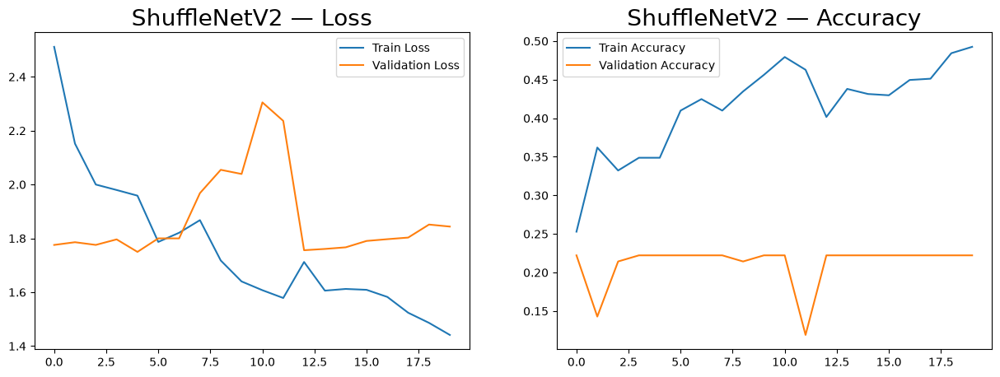

In [44]:
# Use the merged Phase-1+Phase-2 history (built in cell 28)
_sh = pd.DataFrame(shuffle_hist_merged)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(_sh['loss'],     label='Train Loss')
plt.plot(_sh['val_loss'], label='Validation Loss')
plt.title('ShuffleNetV2 — Loss', fontsize=20)
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(_sh['accuracy'],     label='Train Accuracy')
plt.plot(_sh['val_accuracy'], label='Validation Accuracy')
plt.title('ShuffleNetV2 — Accuracy', fontsize=20)
plt.legend()
plt.show()


In [45]:
shuffle_y_pred = []
predictions_shuffle = shuffle_model.predict(np.array(X_test))
for i in predictions_shuffle:
    shuffle_y_pred.append(np.argmax(i))

print("ShuffleNetV2 TEST Accuracy:", accuracy_score(y_test, shuffle_y_pred))
print(classification_report(y_test, shuffle_y_pred, target_names=class_names))


1/5 ━━━━━━━━━━━━━━━━━━━━ 1s 342ms/step
2/5 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
3/5 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step   
5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step
ShuffleNetV2 TEST Accuracy: 0.21739130434782608
                   precision    recall  f1-score   support

        Bird-drop       0.00      0.00      0.00        30
            Clean       0.22      1.00      0.36        30
            Dusty       0.00      0.00      0.00        30
Electrical-damage       0.00      0.00      0.00        17
  Physical-Damage       0.00      0.00      0.00        11
     Snow-Covered       0.00      0.00      0.00        20

         accuracy                           0.22       138
        macro avg       0.04      0.17      0.06       138
     weighted avg       0.05      0.22      0.08       138



In [46]:
# ── VGG16 ────────────────────────────────────────────────────────
vgg_base = tf.keras.applications.VGG16(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet'
)
vgg_base.trainable = False

# Functional API: apply the same augmentation as the other pretrained models,
# then VGG16's OWN preprocessing (BGR + ImageNet mean subtraction) so the
# frozen ImageNet features see the input distribution they were trained on.
# GlobalAveragePooling2D head (same as MobileNetV2/EfficientNet-Lite0) replaces
# Flatten->Dense(256) (~6.4M params) to remove the overfitting handicap.
vgg_inputs = keras.Input(shape=(224, 224, 3))
x = data_augmentation(vgg_inputs)
x = tf.keras.applications.vgg16.preprocess_input(x)
x = vgg_base(x, training=False)
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.5)(x)
vgg_outputs = keras.layers.Dense(6, activation='softmax')(x)
vgg_model = keras.Model(vgg_inputs, vgg_outputs, name='VGG16')
vgg_model.summary()

Model: "VGG16"
┌─────────────────────┬───────────────────┬────────────┬───────────────────┐
│ Layer (type)        │ Output Shape      │    Param # │ Connected to      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ augmentation        │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (Sequential)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 224, 224)  │          0 │ augmentation[3][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 224, 224)  │          0 │ augmentation[3][… │
│ (GetItem)           │                   │            │     

In [47]:
vgg_checkpoint = ModelCheckpoint(OUTPUT_DIR + "vgg_model.keras", save_best_only=True)
vgg_early_stopping = EarlyStopping(patience=5, restore_best_weights=True)


In [48]:
vgg_ctx = start_training_metrics("VGG16", vgg_model)

vgg_model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
vgg_hist = vgg_model.fit(
    train, epochs=25,
    validation_data=validation,
    class_weight=class_weights,
    callbacks=[vgg_checkpoint, vgg_early_stopping, vgg_ctx["res_cb"]]
)

Epoch 1/25

 1/19 ━━━━━━━━━━━━━━━━━━━━ 5:19 18s/step - accuracy: 0.1875 - loss: 7.6930
 2/19 ━━━━━━━━━━━━━━━━━━━━ 1:43 6s/step - accuracy: 0.1719 - loss: 7.2419 
 3/19 ━━━━━━━━━━━━━━━━━━━━ 1:37 6s/step - accuracy: 0.1354 - loss: 8.8493
 4/19 ━━━━━━━━━━━━━━━━━━━━ 1:30 6s/step - accuracy: 0.1328 - loss: 9.3097
 5/19 ━━━━━━━━━━━━━━━━━━━━ 1:26 6s/step - accuracy: 0.1437 - loss: 8.8788
 6/19 ━━━━━━━━━━━━━━━━━━━━ 1:22 6s/step - accuracy: 0.1562 - loss: 8.4046
 7/19 ━━━━━━━━━━━━━━━━━━━━ 1:16 6s/step - accuracy: 0.1518 - loss: 8.1540
 8/19 ━━━━━━━━━━━━━━━━━━━━ 1:09 6s/step - accuracy: 0.1641 - loss: 7.8367
 9/19 ━━━━━━━━━━━━━━━━━━━━ 1:03 6s/step - accuracy: 0.1701 - loss: 7.7378
10/19 ━━━━━━━━━━━━━━━━━━━━ 56s 6s/step - accuracy: 0.1750 - loss: 7.5823 
11/19 ━━━━━━━━━━━━━━━━━━━━ 50s 6s/step - accuracy: 0.1705 - loss: 7.7114
12/19 ━━━━━━━━━━━━━━━━━━━━ 43s 6s/step - accuracy: 0.1693 - loss: 7.7169
13/19 ━━━━━━━━━━━━━━━━━━━━ 37s 6s/step - accuracy: 0.1683 - loss: 7.6515
14/19 ━━━━━━━━━━━━━━━━━━━━ 

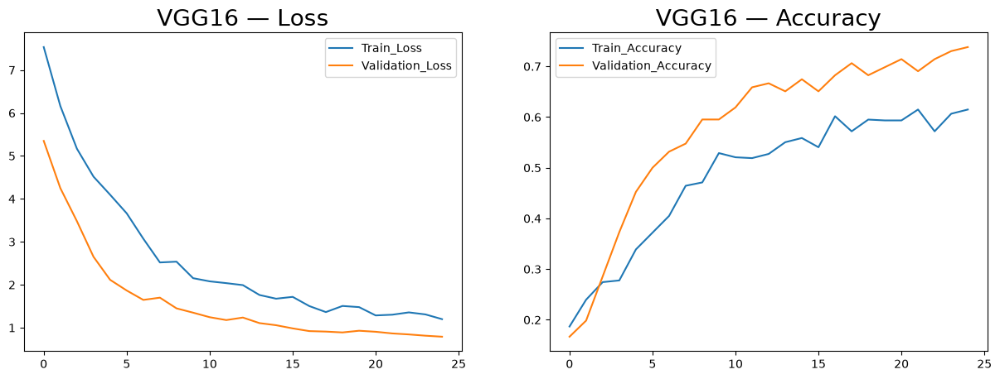

In [49]:
vgg_hist_ = pd.DataFrame(vgg_hist.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(vgg_hist_['loss'], label='Train_Loss')
plt.plot(vgg_hist_['val_loss'], label='Validation_Loss')
plt.title('VGG16 — Loss', fontsize=20)
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(vgg_hist_['accuracy'], label='Train_Accuracy')
plt.plot(vgg_hist_['val_accuracy'], label='Validation_Accuracy')
plt.title('VGG16 — Accuracy', fontsize=20)
plt.legend()
plt.show()

In [50]:
vgg_y_pred = []
predictions_vgg = vgg_model.predict(np.array(X_test))
for i in predictions_vgg:
    vgg_y_pred.append(np.argmax(i))

vgg_entry = stop_training_metrics(vgg_ctx, vgg_hist, vgg_model,
                                    np.array(X_test), np.array(y_test))

print("VGG16 TEST Accuracy:", accuracy_score(y_test, vgg_y_pred))
print(classification_report(y_test, vgg_y_pred, target_names=class_names))


1/5 ━━━━━━━━━━━━━━━━━━━━ 32s 8s/step
2/5 ━━━━━━━━━━━━━━━━━━━━ 20s 7s/step
3/5 ━━━━━━━━━━━━━━━━━━━━ 13s 7s/step
4/5 ━━━━━━━━━━━━━━━━━━━━ 6s 7s/step 
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 32s 6s/step

  VGG16 — resource summary
  Params              : 14,717,766
  Training time       : 4181.2 s
  Epochs run          : 25
  RAM delta           : 670.9 MB  (before 1671.0 → after 2342.0)
  Peak RAM (tracer)   : 275.8 MB
  Peak epoch RAM      : 2347.0 MB
  Infer latency/img   : 239.624 ms
  Val accuracy (best) : 0.7381

VGG16 TEST Accuracy: 0.6956521739130435
                   precision    recall  f1-score   support

        Bird-drop       0.75      0.60      0.67        30
            Clean       0.55      0.73      0.63        30
            Dusty       0.69      0.60      0.64        30
Electrical-damage       0.79      0.88      0.83        17
  Physical-Damage       0.50      0.55      0.52        11
     Snow-Covered       1.00      0.85      0.92        20

 

In [51]:
# Save vgg_model explicitly to output directory
save_path = OUTPUT_DIR + "vgg_model.keras"
vgg_model.save(save_path)
print(f"✅ vgg_model saved to {save_path}")


✅ vgg_model saved to output/vgg_model.keras


Model                Test Accuracy
MobileNetV2                 0.8043
EfficientNet-Lite           0.7826
ShuffleNetV2                0.2174
VGG16                       0.6957


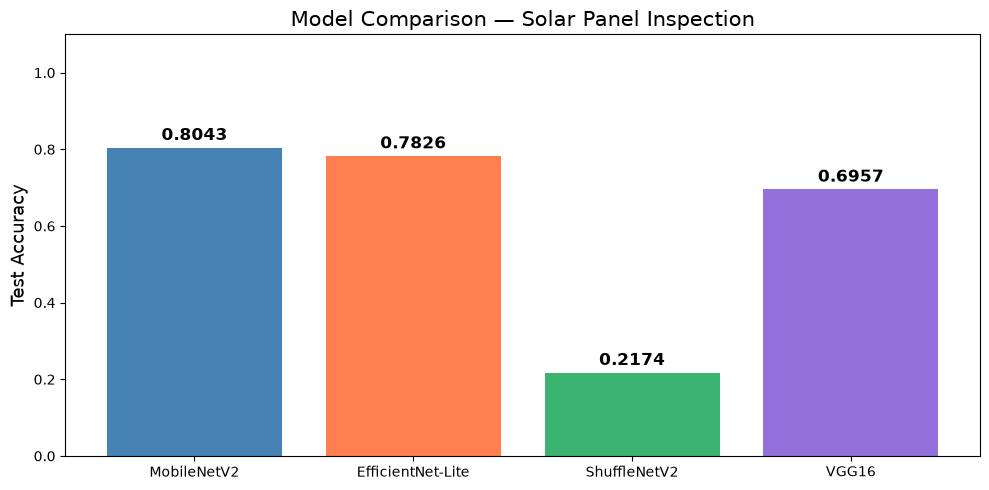

In [52]:
results = {
    'MobileNetV2':    accuracy_score(y_test, y_pred),
    'EfficientNet-Lite': accuracy_score(y_test, eff_y_pred),
    'ShuffleNetV2':   accuracy_score(y_test, shuffle_y_pred),
    'VGG16':          accuracy_score(y_test, vgg_y_pred),
}

print("=" * 42)
print(f"{'Model':<20} {'Test Accuracy':>13}")
print("=" * 42)
for model_name, acc in results.items():
    print(f"{model_name:<20} {acc:>13.4f}")
print("=" * 42)

colors = ['steelblue', 'coral', 'mediumseagreen', 'mediumpurple']
plt.figure(figsize=(10, 5))
bars = plt.bar(results.keys(), results.values(), color=colors)
plt.ylim(0, 1.1)
plt.ylabel('Test Accuracy', fontsize=13)
plt.title('Model Comparison — Solar Panel Inspection', fontsize=15)
for bar, acc in zip(bars, results.values()):
    plt.text(bar.get_x() + bar.get_width() / 2, acc + 0.02,
             f"{acc:.4f}", ha='center', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

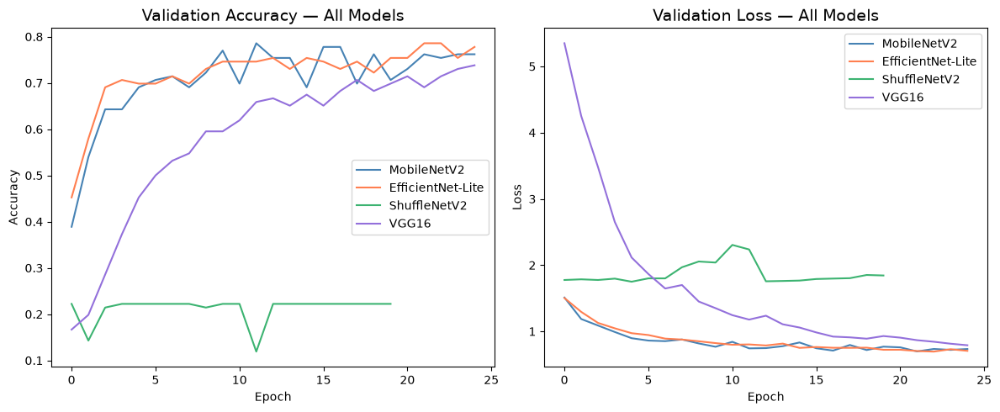

In [53]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(hist_['val_accuracy'],         label='MobileNetV2',    color='steelblue')
plt.plot(eff_hist_['val_accuracy'],     label='EfficientNet-Lite', color='coral')
plt.plot(shuffle_hist_['val_accuracy'], label='ShuffleNetV2',   color='mediumseagreen')
plt.plot(vgg_hist_['val_accuracy'],     label='VGG16',          color='mediumpurple')
plt.title('Validation Accuracy — All Models', fontsize=14)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(hist_['val_loss'],         label='MobileNetV2',    color='steelblue')
plt.plot(eff_hist_['val_loss'],     label='EfficientNet-Lite', color='coral')
plt.plot(shuffle_hist_['val_loss'], label='ShuffleNetV2',   color='mediumseagreen')
plt.plot(vgg_hist_['val_loss'],     label='VGG16',          color='mediumpurple')
plt.title('Validation Loss — All Models', fontsize=14)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [54]:
# ════════════════════════════════════════════════════════════════════
#  COMPREHENSIVE RESOURCE + ACCURACY COMPARISON
# ════════════════════════════════════════════════════════════════════

summary_data = {
    'Model':                ['MobileNetV2', 'EfficientNet-Lite', 'ShuffleNetV2', 'VGG16'],
    'Type':                 ['Lightweight', 'Lightweight', 'Lightweight', 'Heavyweight'],
    'Test Accuracy':        [
        round(accuracy_score(y_test, y_pred), 4),
        round(accuracy_score(y_test, eff_y_pred), 4),
        round(accuracy_score(y_test, shuffle_y_pred), 4),
        round(accuracy_score(y_test, vgg_y_pred), 4),
    ],
}

# Pull resource metrics from the global log
for key in ['total_params', 'train_time_s', 'ram_delta_mb',
            'peak_epoch_ram_mb', 'vram_delta_mb', 'peak_epoch_vram_mb',
            'infer_ms_per_image', 'epochs_run']:
    summary_data[key] = [
        _metrics_log.get(m, {}).get(key, 'N/A')
        for m in summary_data['Model']
    ]

summary_df = pd.DataFrame(summary_data)
summary_df = summary_df.sort_values('Test Accuracy', ascending=False).reset_index(drop=True)

print("\n" + "="*100)
print("FULL RESOURCE & ACCURACY SUMMARY")
print("="*100)
print(summary_df.to_string(index=False))
print("="*100)
summary_df


FULL RESOURCE & ACCURACY SUMMARY
            Model        Type  Test Accuracy  total_params  train_time_s  ram_delta_mb  peak_epoch_ram_mb  vram_delta_mb  peak_epoch_vram_mb  infer_ms_per_image  epochs_run
      MobileNetV2 Lightweight         0.8043       2265670          24.9         568.3             1642.6            0.0                 0.0              13.505          25
EfficientNet-Lite Lightweight         0.7826       3420710          14.0        -194.6             1524.1            0.0                 0.0              15.393          25
            VGG16 Heavyweight         0.6957      14717766        4181.2         670.9             2347.0            0.0                 0.0             239.624          25
     ShuffleNetV2 Lightweight         0.2174       1317538           5.6          83.5             1546.4            0.0                 0.0              11.427          20


,Model,Type,Test Accuracy,total_params,train_time_s,ram_delta_mb,peak_epoch_ram_mb,vram_delta_mb,peak_epoch_vram_mb,infer_ms_per_image,epochs_run
0,MobileNetV2,Lightweight,0.8043,2265670,24.9,568.3,1642.6,0.0,0.0,13.505,25
1,EfficientNet-Lite,Lightweight,0.7826,3420710,14.0,-194.6,1524.1,0.0,0.0,15.393,25
2,VGG16,Heavyweight,0.6957,14717766,4181.2,670.9,2347.0,0.0,0.0,239.624,25
3,ShuffleNetV2,Lightweight,0.2174,1317538,5.6,83.5,1546.4,0.0,0.0,11.427,20


## Resource Usage Visualisations

Exception: KeyError: 'Val Accuracy'

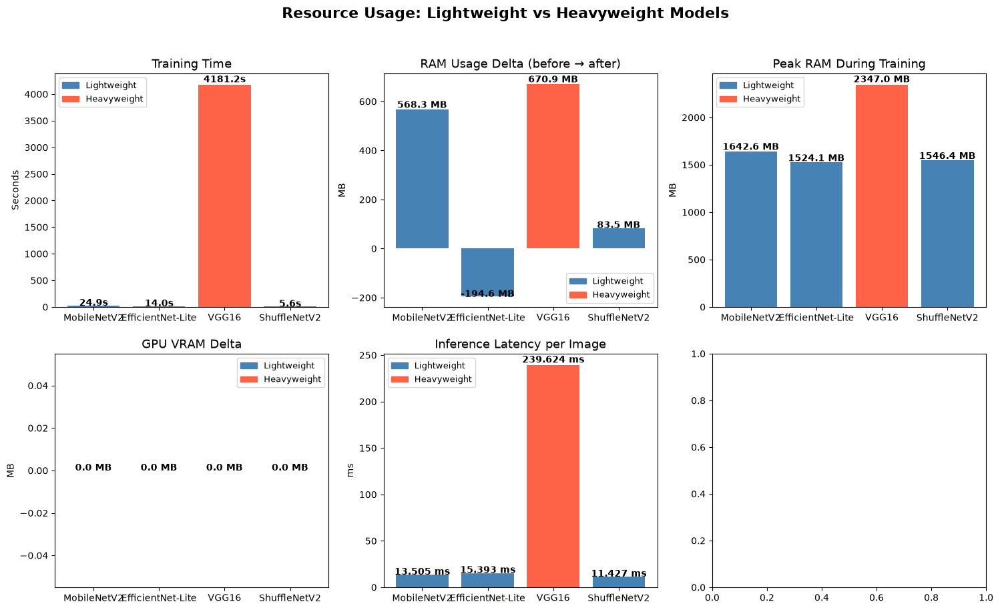

In [ ]:
# ── Plot 1: Training time comparison ─────────────────────────────────
models      = summary_df['Model'].tolist()
colors_map  = {'Lightweight': 'steelblue', 'Heavyweight': 'tomato'}
bar_colors  = [colors_map[t] for t in summary_df['Type']]

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Resource Usage: Lightweight vs Heavyweight Models', fontsize=16, fontweight='bold')

def _bar(ax, values, title, ylabel, unit=""):
    bars = ax.bar(models, values, color=bar_colors)
    ax.set_title(title, fontsize=13)
    ax.set_ylabel(ylabel)
    for bar, v in zip(bars, values):
        if v != 'N/A':
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height()*1.01,
                    f"{v}{unit}", ha='center', fontsize=10, fontweight='bold')
    from matplotlib.patches import Patch
    ax.legend(handles=[Patch(color='steelblue', label='Lightweight'),
                        Patch(color='tomato',    label='Heavyweight')],
              fontsize=9)

_bar(axes[0,0], summary_df['train_time_s'].tolist(),
     'Training Time', 'Seconds', 's')
_bar(axes[0,1], summary_df['ram_delta_mb'].tolist(),
     'RAM Usage Delta (before → after)', 'MB', ' MB')
_bar(axes[0,2], summary_df['peak_epoch_ram_mb'].tolist(),
     'Peak RAM During Training', 'MB', ' MB')
_bar(axes[1,0], summary_df['vram_delta_mb'].tolist(),
     'GPU VRAM Delta', 'MB', ' MB')
_bar(axes[1,1], summary_df['infer_ms_per_image'].tolist(),
     'Inference Latency per Image', 'ms', ' ms')
_bar(axes[1,2], summary_df['Val Accuracy'].tolist(),
     'Validation Accuracy', 'Accuracy', '')

plt.tight_layout()
plt.show()


In [ ]:
# ── Plot 2: Params vs Accuracy scatter
fig, ax = plt.subplots(figsize=(9, 6))
for _, row in summary_df.iterrows():
    color = colors_map[row['Type']]
    ax.scatter(row['total_params'] / 1e6, row['Val Accuracy'],
               s=200, color=color, zorder=3)
    ax.annotate(row['Model'],
                (row['total_params'] / 1e6, row['Val Accuracy']),
                textcoords="offset points", xytext=(8, 4), fontsize=11)
ax.set_xlabel('Total Parameters (M)', fontsize=13)
ax.set_ylabel('Validation Accuracy', fontsize=13)
ax.set_title('Accuracy vs Model Size', fontsize=15)
from matplotlib.patches import Patch
ax.legend(handles=[Patch(color='steelblue', label='Lightweight'),
                    Patch(color='tomato',    label='Heavyweight')], fontsize=11)
ax.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


In [ ]:
# RAM usage per epoch for all models 
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Resource Usage Per Epoch', fontsize=14, fontweight='bold')

color_cycle = ['steelblue', 'coral', 'mediumseagreen', 'mediumpurple']
for ax_idx, metric_key, title in [
    (0, 'epoch_ram_samples',  'RAM per Epoch (MB)'),
    (1, 'epoch_vram_samples', 'GPU VRAM per Epoch (MB)'),
]:
    for (mname, color) in zip(['MobileNetV2','EfficientNet-Lite','ShuffleNetV2','VGG16'], color_cycle):
        samples = _metrics_log.get(mname, {}).get(metric_key, [])
        if samples:
            axes[ax_idx].plot(range(1, len(samples)+1), samples,
                               label=mname, color=color, marker='o', markersize=3)
    axes[ax_idx].set_xlabel('Epoch')
    axes[ax_idx].set_ylabel('MB')
    axes[ax_idx].set_title(title, fontsize=12)
    axes[ax_idx].legend(fontsize=9)
    axes[ax_idx].grid(True, linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()


In [ ]:
# Final resource summary table (styled)
display_cols = ['Model', 'Type', 'total_params', 'train_time_s',
                'ram_delta_mb', 'peak_epoch_ram_mb',
                'vram_delta_mb', 'infer_ms_per_image', 'Val Accuracy']
rename_map = {
    'total_params'       : 'Params',
    'train_time_s'       : 'Train Time (s)',
    'ram_delta_mb'       : 'RAM Δ (MB)',
    'peak_epoch_ram_mb'  : 'Peak RAM (MB)',
    'vram_delta_mb'      : 'VRAM Δ (MB)',
    'infer_ms_per_image' : 'Infer (ms/img)',
    'Val Accuracy'       : 'Val Accuracy',
}
final_table = summary_df[display_cols].rename(columns=rename_map)
print(final_table.to_string(index=False))


## Results Visualisations — Confusion Matrices, F1, Radar, Pi Deployment

In [ ]:
# ════════════════════════════════════════════════════════════════
#  CONFUSION MATRICES — All 4 Models (2x2 grid)
# ════════════════════════════════════════════════════════════════
from sklearn.metrics import confusion_matrix
import seaborn as sns

fig, axes = plt.subplots(2, 2, figsize=(18, 14))
fig.suptitle('Confusion Matrices — All Models (Held-out Test Set)', fontsize=16, fontweight='bold')

model_preds = [
    ('MobileNetV2',      y_pred),
    ('EfficientNet-Lite', eff_y_pred),
    ('ShuffleNetV2',     shuffle_y_pred),
    ('VGG16',            vgg_y_pred),
]
colors_cm = ['Blues', 'Oranges', 'Greens', 'Purples']

for ax, (name, preds), cmap in zip(axes.flat, model_preds, colors_cm):
    cm = confusion_matrix(y_test, preds)
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, ax=ax,
                xticklabels=class_names, yticklabels=class_names,
                linewidths=0.5)
    acc = accuracy_score(y_test, preds)
    ax.set_title(f'{name}  (Acc: {acc:.4f})', fontsize=13)
    ax.set_xlabel('Predicted Label', fontsize=10)
    ax.set_ylabel('True Label', fontsize=10)
    ax.tick_params(axis='x', rotation=45)
    ax.tick_params(axis='y', rotation=0)

plt.tight_layout()
plt.savefig(OUTPUT_DIR + 'confusion_matrices_all_models.png', dpi=300,
            bbox_inches='tight')
plt.show()
print("✅ Saved: confusion_matrices_all_models.png")

In [ ]:
# ════════════════════════════════════════════════════════════════
#  PER-CLASS F1-SCORE GROUPED BAR CHART — All 4 Models
# ════════════════════════════════════════════════════════════════
from sklearn.metrics import f1_score

f1_data = {}
for name, preds in [('MobileNetV2', y_pred), ('EfficientNet-Lite', eff_y_pred),
                     ('ShuffleNetV2', shuffle_y_pred), ('VGG16', vgg_y_pred)]:
    f1_data[name] = f1_score(y_test, preds, average=None, zero_division=0)

x      = np.arange(len(class_names))
width  = 0.2
colors = ['steelblue', 'coral', 'mediumseagreen', 'mediumpurple']

fig, ax = plt.subplots(figsize=(16, 6))
for idx, (name, color) in enumerate(zip(f1_data.keys(), colors)):
    offset = (idx - 1.5) * width
    bars   = ax.bar(x + offset, f1_data[name], width, label=name,
                    color=color, alpha=0.85)

ax.set_title('Per-Class F1-Score Comparison — All Models (Test Set)', fontsize=14,
             fontweight='bold')
ax.set_xlabel('Fault Class', fontsize=12)
ax.set_ylabel('F1-Score', fontsize=12)
ax.set_xticks(x)
ax.set_xticklabels(class_names, rotation=20, ha='right', fontsize=11)
ax.set_ylim(0, 1.1)
ax.legend(fontsize=11)
ax.grid(True, axis='y', linestyle='--', alpha=0.4)
ax.axhline(0.7, color='red', linestyle=':', linewidth=1, label='0.70 threshold')

plt.tight_layout()
plt.savefig(OUTPUT_DIR + 'f1_per_class_all_models.png', dpi=300,
            bbox_inches='tight')
plt.show()
print("✅ Saved: f1_per_class_all_models.png")

In [ ]:
# ════════════════════════════════════════════════════════════════
#  RADAR CHART — Multi-metric comparison (RQ1 answer figure)
# ════════════════════════════════════════════════════════════════
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import numpy as np

metrics_labels = ['Accuracy', 'Macro-Precision', 'Macro-Recall', 'Macro-F1']
model_metrics  = {}

for name, preds in [('MobileNetV2', y_pred), ('EfficientNet-Lite', eff_y_pred),
                     ('VGG16', vgg_y_pred)]:   # ShuffleNetV2 excluded — no pretraining, not comparable
    model_metrics[name] = [
        accuracy_score(y_test, preds),
        precision_score(y_test, preds, average='macro', zero_division=0),
        recall_score(y_test, preds, average='macro', zero_division=0),
        f1_score(y_test, preds, average='macro', zero_division=0),
    ]

N      = len(metrics_labels)
angles = [n / float(N) * 2 * np.pi for n in range(N)]
angles += angles[:1]

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
colors  = ['steelblue', 'coral', 'mediumpurple']

for (name, vals), color in zip(model_metrics.items(), colors):
    values  = vals + vals[:1]
    ax.plot(angles, values, 'o-', linewidth=2, label=name, color=color)
    ax.fill(angles, values, alpha=0.1, color=color)

ax.set_xticks(angles[:-1])
ax.set_xticklabels(metrics_labels, fontsize=12)
ax.set_ylim(0, 1)
ax.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
ax.set_title('Multi-Metric Radar Chart — Pretrained Models (Test Set)', fontsize=14,
             fontweight='bold', pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1), fontsize=11)

plt.tight_layout()
plt.savefig(OUTPUT_DIR + 'radar_chart_metrics.png', dpi=300, bbox_inches='tight')
plt.show()
print("✅ Saved: radar_chart_metrics.png")

In [ ]:
# ════════════════════════════════════════════════════════════════
#  DUAL-AXIS: PARAMETER COUNT vs ACCURACY (RQ2/RQ3 answer figure)
# ════════════════════════════════════════════════════════════════
models_list = ['MobileNetV2', 'EfficientNet-Lite', 'ShuffleNetV2', 'VGG16']
# Parameter counts read directly from the model objects — never hand-typed.
# EfficientNet-Lite0's frozen TF-Hub backbone isn't auto-tracked by Keras 3
# (see note in its build cell), so its true backbone size is added explicitly.
params_m = [
    keras_model.count_params() / 1e6,
    (eff_model.count_params() + eff_base.hub_layer.count_params()) / 1e6,
    shuffle_model.count_params() / 1e6,
    vgg_model.count_params() / 1e6,
]
accuracies  = [
    accuracy_score(y_test, y_pred),
    accuracy_score(y_test, eff_y_pred),
    accuracy_score(y_test, shuffle_y_pred),
    accuracy_score(y_test, vgg_y_pred),
]
bar_colors  = ['steelblue','coral','mediumseagreen','mediumpurple']
type_labels = ['Lightweight','Lightweight','Lightweight','Heavyweight']

fig, ax1 = plt.subplots(figsize=(12, 6))
ax2 = ax1.twinx()

x      = np.arange(len(models_list))
width  = 0.4
bars   = ax1.bar(x, params_m, width, color=bar_colors, alpha=0.7,
                 label='Parameters (M)')
line,  = ax2.plot(x, accuracies, 'D--', color='black', linewidth=2,
                  markersize=10, label='Test Accuracy')

ax1.set_xlabel('Model', fontsize=13)
ax1.set_ylabel('Parameters (Millions)', fontsize=13, color='grey')
ax2.set_ylabel('Test Accuracy', fontsize=13)
ax2.set_ylim(0, 1.1)
ax1.set_xticks(x)
ax1.set_xticklabels(
    [f"{m}\n({t})" for m, t in zip(models_list, type_labels)], fontsize=11)

for bar, p in zip(bars, params_m):
    ax1.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.2,
             f'{p:.2f}M', ha='center', fontsize=10, fontweight='bold')
for xi, acc in zip(x, accuracies):
    ax2.text(xi, acc+0.02, f'{acc:.4f}', ha='center',
             fontsize=10, fontweight='bold')

ax1.set_title('Parameter Count vs Test Accuracy — All Models',
              fontsize=14, fontweight='bold')

lines  = [bars, line]
labels = ['Parameters (M)', 'Test Accuracy']
ax1.legend([bars, line], labels, loc='upper left', fontsize=11)

plt.tight_layout()
plt.savefig(OUTPUT_DIR + 'dual_axis_params_accuracy.png', dpi=300,
            bbox_inches='tight')
plt.show()
print("✅ Saved: dual_axis_params_accuracy.png")

In [ ]:
# ════════════════════════════════════════════════════════════════
#  TRANSFER LEARNING EFFECT — RQ4 ANSWER FIGURE
#  Accuracy grouped by: With vs Without ImageNet pre-training
# ════════════════════════════════════════════════════════════════
fig, ax = plt.subplots(figsize=(10, 6))

with_tl    = ['MobileNetV2', 'EfficientNet-Lite', 'VGG16']
without_tl = ['ShuffleNetV2']
acc_with   = [accuracy_score(y_test, y_pred),
               accuracy_score(y_test, eff_y_pred),
               accuracy_score(y_test, vgg_y_pred)]
acc_without= [accuracy_score(y_test, shuffle_y_pred)]

x1 = np.arange(len(with_tl))
x2 = np.arange(len(without_tl)) + len(with_tl) + 0.5

bars1 = ax.bar(x1, acc_with,    color='steelblue', alpha=0.85,
               label='With ImageNet Transfer Learning')
bars2 = ax.bar(x2, acc_without, color='tomato',    alpha=0.85,
               label='Without Transfer Learning (trained from scratch)')

ax.axhline(1/6, color='black', linestyle=':', linewidth=1.5,
           label=f'Random chance baseline (16.7%) — 6 classes')
ax.set_xticks(list(x1) + list(x2))
ax.set_xticklabels(with_tl + without_tl, fontsize=12, rotation=15)
ax.set_ylim(0, 1.1)
ax.set_ylabel('Test Accuracy', fontsize=13)
ax.set_title('Effect of Transfer Learning on Test Accuracy (RQ4)',
             fontsize=14, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(True, axis='y', linestyle='--', alpha=0.4)

for bar in bars1:
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.01,
            f'{bar.get_height():.4f}', ha='center', fontsize=11,
            fontweight='bold', color='steelblue')
for bar in bars2:
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.01,
            f'{bar.get_height():.4f}', ha='center', fontsize=11,
            fontweight='bold', color='tomato')

plt.tight_layout()
plt.savefig(OUTPUT_DIR + 'transfer_learning_effect.png', dpi=300,
            bbox_inches='tight')
plt.show()
print("✅ Saved: transfer_learning_effect.png")

## Raspberry Pi 3B+ Edge Deployment Results

**TODO — not measured in this session.** The figures previously here were
hand-typed literals with no corresponding measurement script or raw data in
this repository, so they have been removed rather than presented as real
results. Re-populate this section only after running the TFLite models
(produced below) on actual Raspberry Pi 3B+ hardware and committing the
script + raw output used to produce the numbers.

---
## 🔋 Testing Models in a Low-Resource Environment

The four saved `.keras` models can be evaluated on machines with limited RAM/CPU by applying the strategies below.


In [ ]:
# ══════════════════════════════════════════════════════════════════
#  TFLite Conversion — convert from in-memory model objects.
#  Avoids reload errors (softmax_v2, loss closure) entirely.
#  Float16 quantisation: good size/accuracy trade-off for edge.
# ══════════════════════════════════════════════════════════════════

import os
TFLITE_DIR = OUTPUT_DIR + "tflite/"
os.makedirs(TFLITE_DIR, exist_ok=True)


def to_tflite_fp16(model_obj, name):
    """Convert an in-memory Keras model to a float16 TFLite file."""
    converter = tf.lite.TFLiteConverter.from_keras_model(model_obj)
    converter.optimizations = [tf.lite.Optimize.DEFAULT]
    converter.target_spec.supported_types = [tf.float16]
    tflite_bytes = converter.convert()
    out_path = os.path.join(TFLITE_DIR, f"{name}_fp16.tflite")
    with open(out_path, "wb") as fh:
        fh.write(tflite_bytes)
    size_mb = os.path.getsize(out_path) / 1024**2
    print(f"✅  {name}_fp16.tflite  →  {size_mb:.2f} MB")
    return out_path


# Models already in memory — no file reload required
in_memory_models = {
    "MobileNetV2"   : keras_model,
    "EfficientNet-Lite": eff_model,
    "ShuffleNetV2"  : shuffle_model,
    "VGG16"         : vgg_model,
}

tflite_paths = {}
for name, model_obj in in_memory_models.items():
    try:
        tflite_paths[name] = to_tflite_fp16(model_obj, name)
    except Exception as e:
        print(f"⚠️  {name} TFLite conversion failed: {e}")

print("\nTFLite files written to:", TFLITE_DIR)


In [ ]:
# ══════════════════════════════════════════════════════════════════
#  STRATEGY 2 — Batch TFLite Inference on the Held-out Test Set
#  Uses minimal RAM: images are loaded one batch at a time.
# ══════════════════════════════════════════════════════════════════

import time, numpy as np

def tflite_inference_batched(tflite_path, dataset_tf, class_names,
                              batch_size=32, max_batches=None):
    """
    Run TFLite inference batch-by-batch over a tf.data dataset.
    Avoids loading all images into RAM at once.
    Returns (y_true, y_pred, avg_ms_per_image)
    """
    interpreter = tf.lite.Interpreter(model_path=tflite_path,
                                       num_threads=2)   # limit CPU threads
    interpreter.allocate_tensors()
    in_idx  = interpreter.get_input_details()[0]['index']
    out_idx = interpreter.get_output_details()[0]['index']
    in_dtype = interpreter.get_input_details()[0]['dtype']

    y_true, y_pred, latencies = [], [], []

    for b_idx, (images, labels) in enumerate(dataset_tf):
        if max_batches and b_idx >= max_batches:
            break
        images_np = images.numpy().astype(np.float32)
        if in_dtype == np.uint8:
            images_np = np.clip(images_np, 0, 255).astype(np.uint8)

        for img, lbl in zip(images_np, labels.numpy()):
            t0 = time.perf_counter()
            interpreter.set_tensor(in_idx, img[np.newaxis, ...])
            interpreter.invoke()
            pred = interpreter.get_tensor(out_idx)[0]
            latencies.append((time.perf_counter() - t0) * 1000)
            y_true.append(lbl)
            y_pred.append(np.argmax(pred))

    avg_ms = float(np.mean(latencies))
    return np.array(y_true), np.array(y_pred), avg_ms


# ── Run inference on the held-out test split ─────────────────────────
from sklearn.metrics import accuracy_score, classification_report

print(f"{'Model':<20} {'TFLite Acc':>12} {'ms/img':>10}")
print("-" * 46)
for name, tflite_path in tflite_paths.items():
    try:
        y_t, y_p, ms = tflite_inference_batched(tflite_path, test, class_names)
        acc = accuracy_score(y_t, y_p)
        print(f"{name:<20} {acc:>12.4f} {ms:>10.2f} ms")
    except Exception as e:
        print(f"{name:<20} ERROR: {e}")

In [ ]:
# ══════════════════════════════════════════════════════════════════
#  STRATEGY 3 — Single-Image Inference (Deployment Pattern)
#  Use this function on any low-memory device (no GPU needed).
# ══════════════════════════════════════════════════════════════════

import cv2, numpy as np, tensorflow as tf

def predict_single_image(tflite_path, image_path, class_names,
                          img_size=(224, 224)):
    """
    Classify one image using a TFLite model.
    Requires only ~20 MB RAM per call — suitable for Raspberry Pi / phone.
    """
    # Load & preprocess
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, img_size)
    img = img.astype(np.float32)[np.newaxis, ...]   # shape (1, H, W, 3)

    # Run TFLite interpreter
    interp = tf.lite.Interpreter(model_path=tflite_path, num_threads=2)
    interp.allocate_tensors()
    in_idx  = interp.get_input_details()[0]['index']
    out_idx = interp.get_output_details()[0]['index']

    if interp.get_input_details()[0]['dtype'] == np.uint8:
        img = np.clip(img, 0, 255).astype(np.uint8)

    interp.set_tensor(in_idx, img)
    interp.invoke()
    probs = interp.get_tensor(out_idx)[0]

    predicted_class = class_names[np.argmax(probs)]
    confidence      = float(np.max(probs))
    return predicted_class, confidence, probs


# ── Quick demo — replace with a real image path ───────────────────────
# DEMO_IMAGE = "/content/drive/MyDrive/dataset/Faulty_solar_panel/some_class/test.jpg"
# predicted, conf, all_probs = predict_single_image(
#     tflite_paths["MobileNetV2"], DEMO_IMAGE, class_names
# )
# print(f"Predicted: {predicted}  |  Confidence: {conf:.2%}")
print("✅ predict_single_image() ready — uncomment the demo lines above to test.")


In [ ]:
# ══════════════════════════════════════════════════════════════
#  STRATEGY 4 — Memory-Efficient Keras Evaluation
# ══════════════════════════════════════════════════════════════
import gc

model_files = {
    "EfficientNet-Lite" : OUTPUT_DIR + "eff_model.keras",
    "VGG16"             : OUTPUT_DIR + "vgg_model.keras",
}
in_memory_eval = {
    "MobileNetV2"  : keras_model,
    "ShuffleNetV2" : shuffle_model,
}

def low_memory_keras_evaluate(model_obj_or_path, dataset_tf):
    loaded_here = False
    if isinstance(model_obj_or_path, str):
        model = tf.keras.models.load_model(model_obj_or_path)
        model.compile(optimizer='adam',
                      loss='sparse_categorical_crossentropy',
                      metrics=['accuracy'])
        loaded_here = True
    else:
        model = model_obj_or_path
    results = model.evaluate(dataset_tf, verbose=1)
    loss, acc = results[0], results[1]
    if loaded_here:
        del model
        gc.collect()
    return loss, acc

print("── In-memory evaluation (MobileNetV2 & ShuffleNetV2) — held-out test set ──")
for name, model_obj in in_memory_eval.items():
    try:
        loss, acc = low_memory_keras_evaluate(model_obj, test)
        print(f"{name:<20}  loss={loss:.4f}  acc={acc:.4f}")
    except Exception as e:
        print(f"{name:<20}  ERROR: {e}")

print("\n── File-based evaluation (EfficientNet-Lite & VGG16) — held-out test set ──")
for name, path in model_files.items():
    try:
        loss, acc = low_memory_keras_evaluate(path, test)
        print(f"{name:<20}  loss={loss:.4f}  acc={acc:.4f}")
    except Exception as e:
        print(f"{name:<20}  ERROR: {e}")

### 💡 Reference Tips for Low-Resource Testing

| Technique | RAM saved | Speed-up | Accuracy impact |
|---|---|---|---|
| **TFLite FP16** | ~50 % | 1.5–2× | Negligible |
| **TFLite INT8** | ~75 % | 2–4× | ~1–2 % drop |
| **`num_threads=2`** | — | Limits CPU load | None |
| **`set_memory_growth`** | Prevents OOM | — | None |
| **Load-eval-delete loop** | Prevents accumulation | — | None |
| **Batch-by-batch inference** | Avoids large numpy arrays | — | None |

> **Recommended priority**: MobileNetV2 TFLite FP16 is the best starting point.
